## Assignment 4

In [2]:
# Importing Dependencies
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import seaborn as sns
sns.set_style('whitegrid')

import torch
import torch.nn as nn
import torch.distributions as dist
import torch.nn.functional as Fun
import torch.optim as optim

---
## Question 1 [1 Marks]

Implement Logistic Regression using the Pyro library referring [1] for guidance. 

Show both the mean prediction as well as standard deviation in the predictions over the 2d grid. Use NUTS MCMC sampling to sample the posterior. Take 1000 samples for posterior distribution and use 500 samples as burn/warm up. Use the below given dataset.


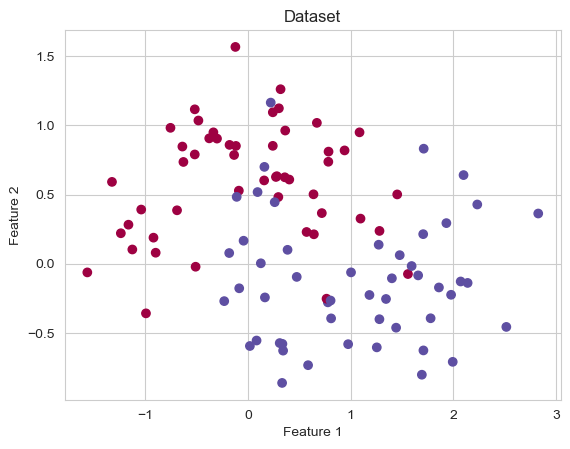

In [3]:
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split

X, y = make_moons(n_samples=100, noise=0.3, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2, random_state=41)
# X_train = torch.tensor(X_train); y_train = torch.tensor(y_train)
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32)

plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Spectral)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Dataset')
plt.show()

In [4]:
import pyro
import pyro.distributions as dist
from pyro.infer import MCMC, NUTS

# Defining the logistic regression pyro model

def logistic_regression(X, y=None):
    # The weights and bias are random variables, we assume the weights to be normally distributed
    weight = pyro.sample("weight", dist.Normal(0, 1).expand([X.shape[1]]))
    bias = pyro.sample("bias", dist.Normal(0, 1))

    # Compute the logits
    logits = torch.matmul(X, weight) + bias

    # Model observation (likelihood)
    # Repeated block of code repeated X.shape[0] times named "data"
    with pyro.plate("data", X.shape[0]):
        obs = pyro.sample("obs", dist.Bernoulli(logits=logits), obs=y)

In [5]:
# Running the model on the data

model = logistic_regression; num_samples = 1000; burn_in = 500
posterior = MCMC(NUTS(model), num_samples=num_samples, warmup_steps=burn_in)
posterior.run(X_train, y_train)

weights_samples = posterior.get_samples()["weight"]
bias_samples = posterior.get_samples()["bias"]

weights_samples.shape, bias_samples.shape

Sample: 100%|██████████| 1500/1500 [00:08, 186.67it/s, step size=7.36e-01, acc. prob=0.886]


(torch.Size([1000, 2]), torch.Size([1000]))

In [6]:
# Define the grid over which you want to make predictions
grid_x = np.linspace(X[:, 0].min() - 1, X[:, 0].max() + 1, 100)
grid_y = np.linspace(X[:, 1].min() - 1, X[:, 1].max() + 1, 100)
grid_xx, grid_yy = np.meshgrid(grid_x, grid_y)
grid = np.column_stack([grid_xx.ravel(), grid_yy.ravel()])

grid.shape

(10000, 2)

In [7]:
# Calculate the logits for each sample
logits_samples = torch.matmul(torch.tensor(grid, dtype=torch.float32), weights_samples.t()) + bias_samples
prob_samples = torch.sigmoid(logits_samples)
mean_predictions, std_predictions = prob_samples.mean(1), prob_samples.std(1)

prob_samples.shape, mean_predictions.shape, std_predictions.shape

(torch.Size([10000, 1000]), torch.Size([10000]), torch.Size([10000]))

Text(0.5, 0.98, 'Logistic Regression Mean Prediction')

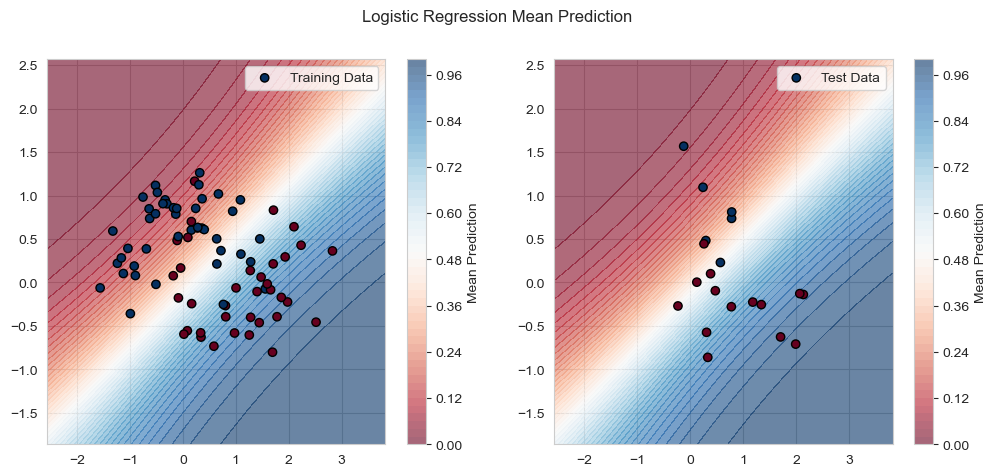

In [8]:
mean_predictions = mean_predictions.reshape(grid_xx.shape)
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

contour1 = ax[0].contourf(grid_xx, grid_yy, mean_predictions, levels=50, cmap="RdBu", alpha=0.6)
colorbar1 = plt.colorbar(contour1, ax=ax[0], label='Mean Prediction')

contour2 = ax[1].contourf(grid_xx, grid_yy, mean_predictions, levels=50, cmap="RdBu", alpha=0.6)
colorbar2 = plt.colorbar(contour2, ax=ax[1], label='Mean Prediction')

ax[0].scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap="RdBu_r", edgecolor='k', label = 'Training Data')
ax[1].scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap="RdBu_r", edgecolor='k', label = 'Test Data')
ax[0].legend(); ax[1].legend()
fig.suptitle('Logistic Regression Mean Prediction')

Text(0.5, 0.98, 'Logistic Regression Std Prediction')

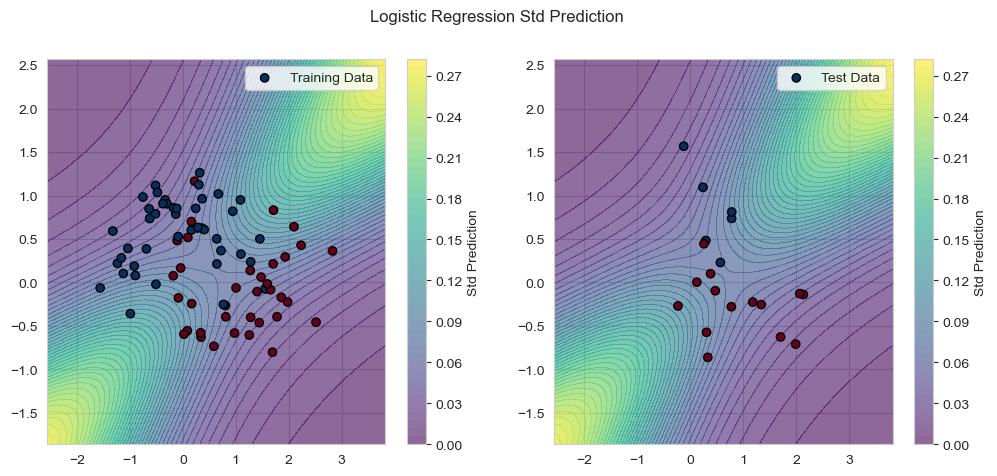

In [9]:
std_predictions = std_predictions.reshape(grid_xx.shape)
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

contour1 = ax[0].contourf(grid_xx, grid_yy, std_predictions, levels=50, cmap="viridis", alpha=0.6)
colorbar1 = plt.colorbar(contour1, ax=ax[0], label='Std Prediction')

contour2 = ax[1].contourf(grid_xx, grid_yy, std_predictions, levels=50, cmap="viridis", alpha=0.6)
colorbar2 = plt.colorbar(contour2, ax=ax[1], label='Std Prediction')

ax[0].scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap="RdBu_r", edgecolor='k', label = 'Training Data')
ax[1].scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap="RdBu_r", edgecolor='k', label = 'Test Data')
ax[0].legend(); ax[1].legend()
fig.suptitle('Logistic Regression Std Prediction')

## Question 2 [2 Marks]

Consider the FVC dataset example discussed in the class. 

We had only used the train dataset. Now, we want to find out the performance of various models on the test dataset. 

Use the given dataset and deduce which model works best in terms of error (MAE) and coverage? The base model is Linear Regression by Sklearn (from sklearn.linear_model import LinearRegression). Plot the trace diagrams and posterior distribution. 

Also plot the predictive posterior distribution with 90% confidence interval.

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
# Retina display
%config InlineBackend.figure_format = 'retina'
from jax import random

import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.constrained_layout.use'] = True

import seaborn as sns
sns.set_context("notebook")

import numpyro
import numpyro.distributions as dist

In [11]:
import os
import requests

URL = "https://gist.githubusercontent.com/ucals/" + "2cf9d101992cb1b78c2cdd6e3bac6a4b/raw/"+ "43034c39052dcf97d4b894d2ec1bc3f90f3623d9/"+ "osic_pulmonary_fibrosis.csv"

if not os.path.exists("osic_pulmonary_fibrosis.csv"):
    response = requests.get(URL)

    with open("osic_pulmonary_fibrosis.csv", "wb") as f:
        f.write(response.content)

train = pd.read_csv("osic_pulmonary_fibrosis.csv")
train.head()

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker


In [12]:
train.describe()

,Weeks,FVC,Percent,Age
count,1549.000000,1549.000000,1549.000000,1549.000000
mean,31.861846,2690.479019,77.672654,67.188509
std,23.247550,832.770959,19.823261,7.057395
min,-5.000000,827.000000,28.877577,49.000000
25%,12.000000,2109.000000,62.832700,63.000000
50%,28.000000,2641.000000,75.676937,68.000000
75%,47.000000,3171.000000,88.621065,72.000000
max,133.000000,6399.000000,153.145378,88.000000


In [13]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

patient_encoder = LabelEncoder()
train["patient_code"] = patient_encoder.fit_transform(train["Patient"].values)

X = train.drop(columns=["Patient", "FVC", "Percent", "Age", "Sex", "SmokingStatus"])
y = train["FVC"]
x_train, x_test, y_train, y_test = train_test_split(X, y, train_size = 0.8, random_state = 0)

In [14]:
x_train

,Weeks,patient_code
295,63,33
516,63,59
655,46,74
838,48,94
452,61,51
...,...,...
763,27,86
835,18,94
1216,38,138
559,73,63


In [15]:
len(x_train), len(x_test), len(y_train), len(y_test)

(1239, 310, 1239, 310)

In [16]:
sample_patient_code_train = x_train["patient_code"].values
sample_patient_code_test = x_test["patient_code"].values
x_train = x_train["Weeks"]
x_test = x_test["Weeks"]

# Converting into numpy arrays
x_train = np.array(x_train); x_test = np.array(x_test)
y_train = np.array(y_train); y_test = np.array(y_test)

In [17]:
x_train, y_train

(array([63, 63, 46, ..., 38, 73, 18]),
 array([2957, 3327, 2205, ..., 3882, 3907, 3054]))

### Vanilla Linear Regression

In [18]:
### Linear regression from scikit-learn
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(x_train.reshape(-1, 1), y_train)

LinearRegression()

In [19]:
lr_sigma = np.std(y_train - lr.predict(x_train.reshape(-1, 1)))
lr.coef_, lr.intercept_, lr_sigma

(array([-1.68051699]), 2747.966054074546, 843.8124655154415)

Text(0, 0.5, 'FVC')

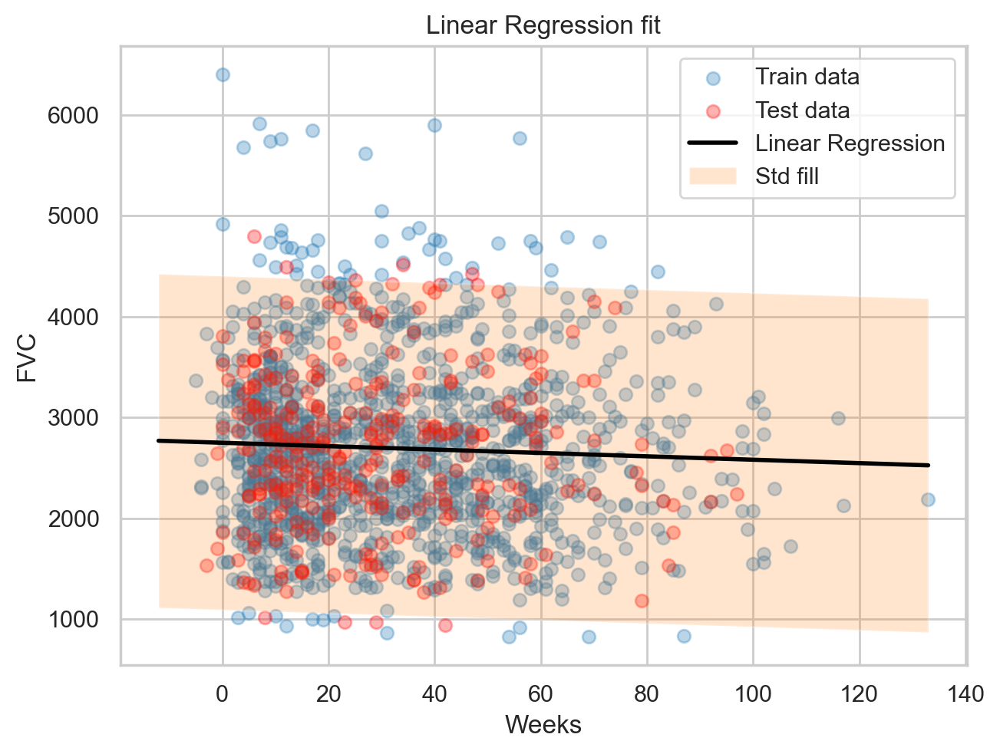

In [20]:
# Plot the data and the regression line
all_weeks = np.arange(-12, 134, 1)

plt.scatter(x_train, y_train, alpha=0.3, label = "Train data")
plt.scatter(x_test, y_test, color="red", alpha=0.3, label = "Test data")
plt.plot(all_weeks, lr.predict(all_weeks.reshape(-1, 1)), color="black", lw=2, label = "Linear Regression")
plt.fill_between(all_weeks, lr.predict(all_weeks.reshape(-1, 1)) - 1.96*lr_sigma, 
                 lr.predict(all_weeks.reshape(-1, 1)) + 1.96*lr_sigma, alpha=0.2, label = "Std fill")
plt.title("Linear Regression fit")
plt.legend()
plt.xlabel("Weeks")
plt.ylabel("FVC")

In [21]:
# Finding the mean absolute error on train set
from sklearn.metrics import mean_absolute_error

maes = {}
maes["LinearRegression on train"] = mean_absolute_error(y_train, lr.predict(x_train.reshape(-1, 1)))
maes["LinearRegression on test"] = mean_absolute_error(y_test, lr.predict(x_test.reshape(-1, 1)))
maes

{'LinearRegression on train': 662.1236659544445,
 'LinearRegression on test': 626.3184730275215}

In [22]:
# Finding the 95% coverage on train set

def coverage(y_true, y_pred, sigma):
    lower = y_pred - 1.96 * sigma
    upper = y_pred + 1.96 * sigma
    return np.mean((y_true >= lower) & (y_true <= upper))

coverages = {}
print("Train Coverage: ", coverage(y_train, lr.predict(x_train.reshape(-1, 1)), lr_sigma))
coverages["LinearRegression on test"] = coverage(y_test, lr.predict(x_test.reshape(-1, 1)), lr_sigma)
coverages["LinearRegression on train"] = coverage(y_train, lr.predict(x_train.reshape(-1, 1)), lr_sigma)
coverages

Train Coverage:  0.9548022598870056


{'LinearRegression on test': 0.9709677419354839,
 'LinearRegression on train': 0.9548022598870056}

### Pooled model

\begin{align}
\alpha \sim  \text{Normal}(0, 500) \\
\beta \sim  \text{Normal}(0, 500) \\
\sigma \sim  \text{HalfNormal}(100) \\
\end{align}

for i in range(N_Weeks):

\begin{align}
FVC_i \sim  \text{Normal}(\alpha + \beta \cdot Week_i, \sigma)
\end{align}


In [23]:
def pooled_model(sample_weeks, sample_fvc=None):
    α = numpyro.sample("α", dist.Normal(0., 500.))
    β = numpyro.sample("β", dist.Normal(0., 500.))
    σ = numpyro.sample("σ", dist.HalfNormal(50.))
    with numpyro.plate("samples", len(sample_weeks)):
        fvc = numpyro.sample("fvc", dist.Normal(α + β * sample_weeks, σ), obs=sample_fvc)
    return fvc

sample_weeks = train["Weeks"].values
sample_fvc = train["FVC"].values

In [24]:
from numpyro.infer import MCMC, NUTS, Predictive
nuts_kernel = NUTS(pooled_model)

mcmc = MCMC(nuts_kernel, num_samples=4000, num_warmup=2000)
rng_key = random.PRNGKey(0)

mcmc.run(rng_key, sample_weeks=x_train, sample_fvc=y_train)
posterior_samples = mcmc.get_samples()

sample: 100%|██████████| 6000/6000 [00:02<00:00, 2206.33it/s, 7 steps of size 4.57e-01. acc. prob=0.91]


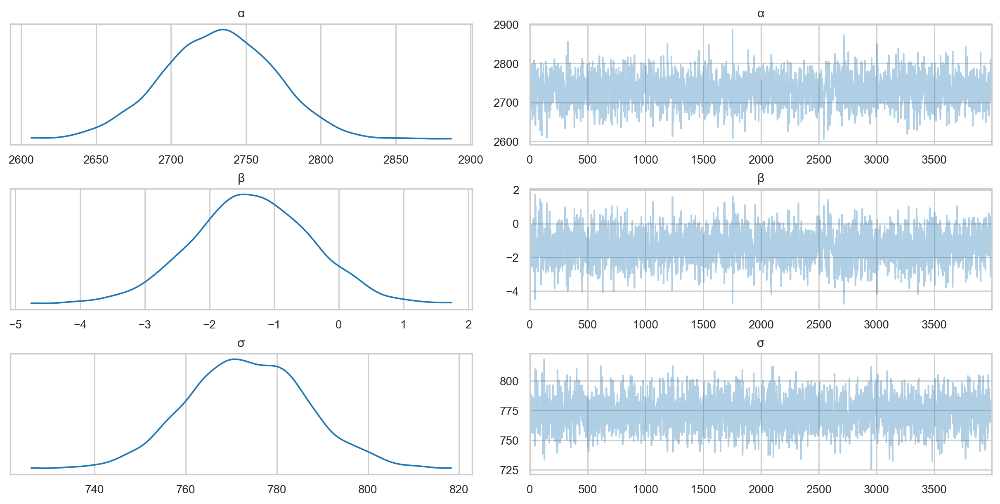

In [25]:
import arviz as az

idata = az.from_numpyro(mcmc)
az.plot_trace(idata, compact=True);

In [26]:
# Summary statistics
az.summary(idata, round_to=2)

arviz - WARNING - Shape validation failed: input_shape: (1, 4000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
α,2731.78,37.24,2658.75,2798.00,0.90,0.64,1713.98,1879.14,NaN
β,-1.36,0.93,-3.01,0.44,0.02,0.02,1649.09,1842.16,NaN
σ,773.41,12.98,750.62,799.75,0.25,0.18,2697.11,2607.93,NaN


Making predictions

(4000, 146)


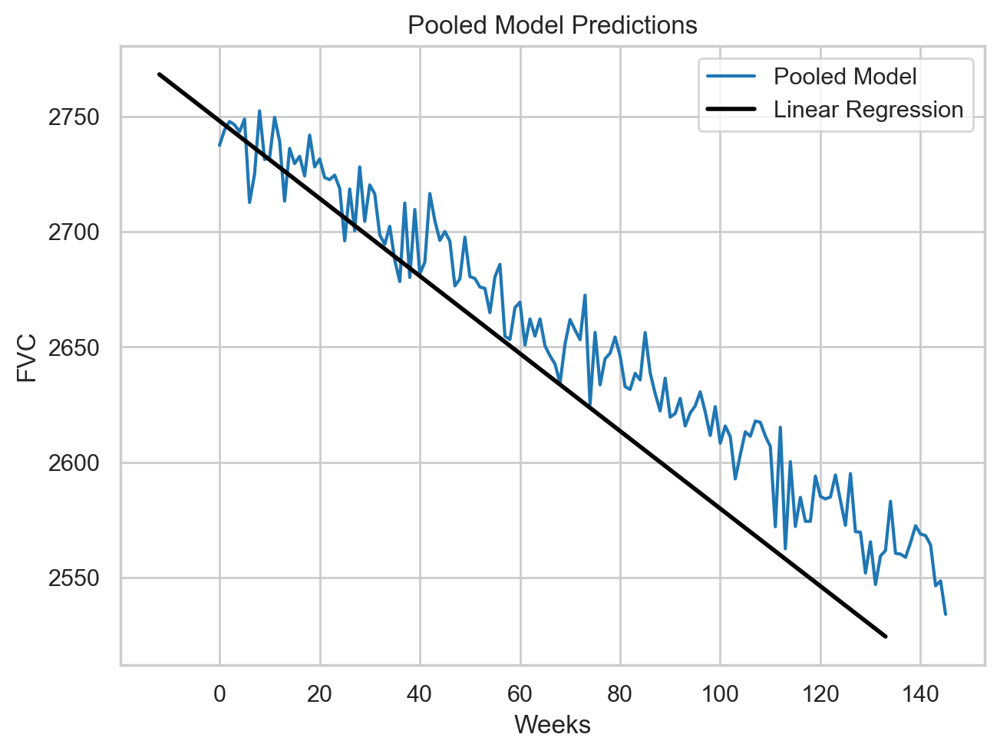

In [27]:
predictive = Predictive(pooled_model, mcmc.get_samples())
predictions = predictive(rng_key, all_weeks, None)
print(predictions["fvc"].shape)

pd.DataFrame(predictions["fvc"]).mean().plot(label = "Pooled Model")
plt.plot(all_weeks, lr.predict(all_weeks.reshape(-1, 1)), color="black", lw=2, label = "Linear Regression")
plt.title("Pooled Model Predictions")
plt.xlabel("Weeks"); plt.ylabel("FVC")
plt.legend()

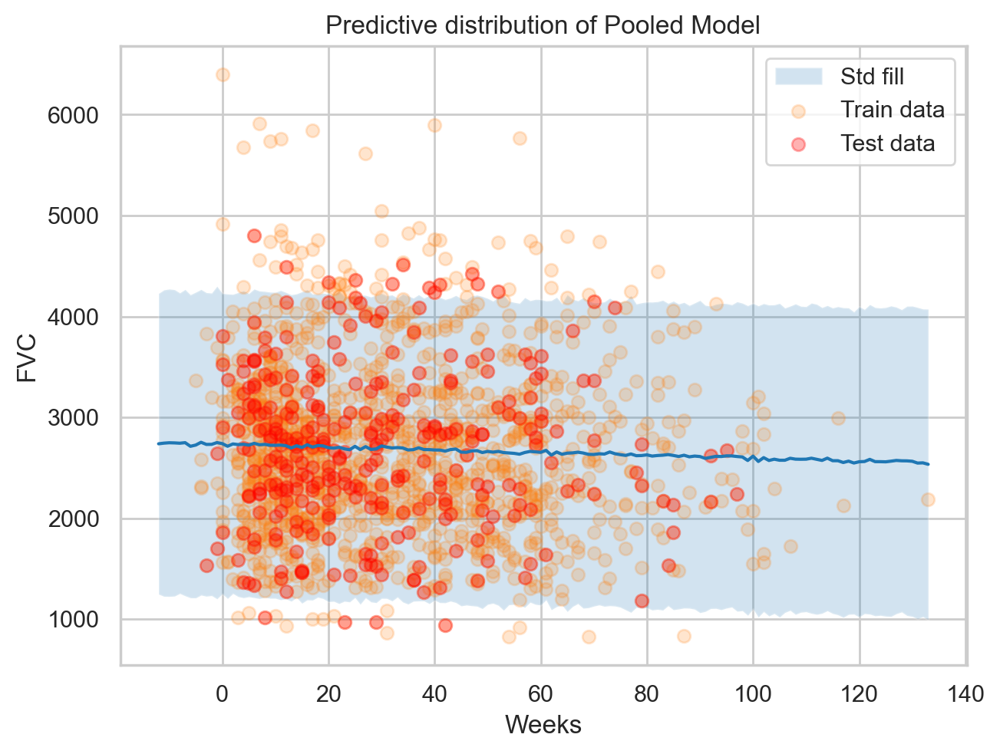

In [28]:
# Predictive distribution
predictive = Predictive(pooled_model, mcmc.get_samples())
predictions = predictive(rng_key, all_weeks, None)

# Get the mean and standard deviation of the predictions
mu = predictions["fvc"].mean(axis=0)
sigma = predictions["fvc"].std(axis=0)

# Plot the predictions
plt.plot(all_weeks, mu)
plt.fill_between(all_weeks, mu - 1.96*sigma, mu + 1.96*sigma, alpha=0.2, label = "Std fill")
plt.scatter(sample_weeks, sample_fvc, alpha=0.2, label = "Train data")
plt.scatter(x_test, y_test, color="red", alpha=0.3, label = "Test data")
plt.xlabel("Weeks")
plt.title("Predictive distribution of Pooled Model")
plt.ylabel("FVC")
plt.legend()

In [29]:
### Computing Mean Absolute Error and Coverage at 95% confidence interval

preds_pooled  = predictive(rng_key, x_train, None)['fvc']
predictions_train_pooled = preds_pooled.mean(axis=0)
std_train_pooled = preds_pooled.std(axis=0)

pred_test_pooled = predictive(rng_key, x_test, None)['fvc']
predictions_test_pooled = pred_test_pooled.mean(axis=0)
std_test_pooled = pred_test_pooled.std(axis=0)

maes["PooledModel on train"] = mean_absolute_error(y_train, predictions_train_pooled)
maes["PooledModel on test"] = mean_absolute_error(y_test, predictions_test_pooled)
maes

{'LinearRegression on train': 662.1236659544445,
 'LinearRegression on test': 626.3184730275215,
 'PooledModel on train': 661.24235853637,
 'PooledModel on test': 626.4491242439516}

In [30]:
### Computing the coverage at 95% confidence interval

coverages["PooledModel on test"] = coverage(y_test, predictions_test_pooled, std_test_pooled).item()
coverages["PooledModel on train"] = coverage(y_train, predictions_train_pooled, std_train_pooled).item()
coverages

{'LinearRegression on test': 0.9709677419354839,
 'LinearRegression on train': 0.9548022598870056,
 'PooledModel on test': 0.948387086391449,
 'PooledModel on train': 0.938660204410553}

### Partially pooled model with the same sigma

\begin{align}
&\mu_{alpha} \sim  \text{Normal}(0, 500) \\
&\sigma_{alpha} \sim  \text{HalfNormal}(100) \\
&\mu_{beta} \sim  \text{Normal}(0, 500) \\
&\sigma_{beta} \sim  \text{HalfNormal}(100) \\
&\alpha \sim  \text{Normal}(mu_{alpha}, sigma_{alpha}) \\
&\beta \sim  \text{Normal}(mu_{beta}, sigma_{beta}) \\
&\sigma \sim  \text{HalfNormal}(100) \\
\end{align}

if i is the patient id, j is the week index

\begin{align}
FVC_{ij} \sim = \text{Normal}(\alpha_i + \beta_i \cdot Week_{j}, \sigma)
\end{align}

In [31]:
### Hierarchical model

def paritally_pooled_model(sample_weeks, sample_patient_code, sample_fvc=None):
    μ_α = numpyro.sample("μ_α", dist.Normal(0.0, 500.0))
    σ_α = numpyro.sample("σ_α", dist.HalfNormal(100.0))
    μ_β = numpyro.sample("μ_β", dist.Normal(0.0, 3.0))
    σ_β = numpyro.sample("σ_β", dist.HalfNormal(3.0))

    n_patients = len(np.unique(sample_patient_code))

    with numpyro.plate("Participants", n_patients):
        α = numpyro.sample("α", dist.Normal(μ_α, σ_α))
        β = numpyro.sample("β", dist.Normal(μ_β, σ_β))

    σ = numpyro.sample("σ", dist.HalfNormal(100.0))
    FVC_est = α[sample_patient_code] + β[sample_patient_code] * sample_weeks

    with numpyro.plate("data", len(sample_patient_code)):
        numpyro.sample("fvc", dist.Normal(FVC_est, σ), obs=sample_fvc)

In [32]:
model_kwargs_train = {"sample_weeks": x_train, "sample_patient_code": sample_patient_code_train, "sample_fvc": y_train}
model_kwargs_test = {"sample_weeks": x_test, "sample_patient_code": sample_patient_code_test, "sample_fvc": y_test}

In [33]:
nuts_final = NUTS(paritally_pooled_model)

mcmc_final = MCMC(nuts_final, num_samples=4000, num_warmup=2000)
rng_key = random.PRNGKey(0)

mcmc_final.run(rng_key, **model_kwargs_train)

sample: 100%|██████████| 6000/6000 [00:15<00:00, 388.28it/s, 63 steps of size 1.73e-02. acc. prob=0.85] 


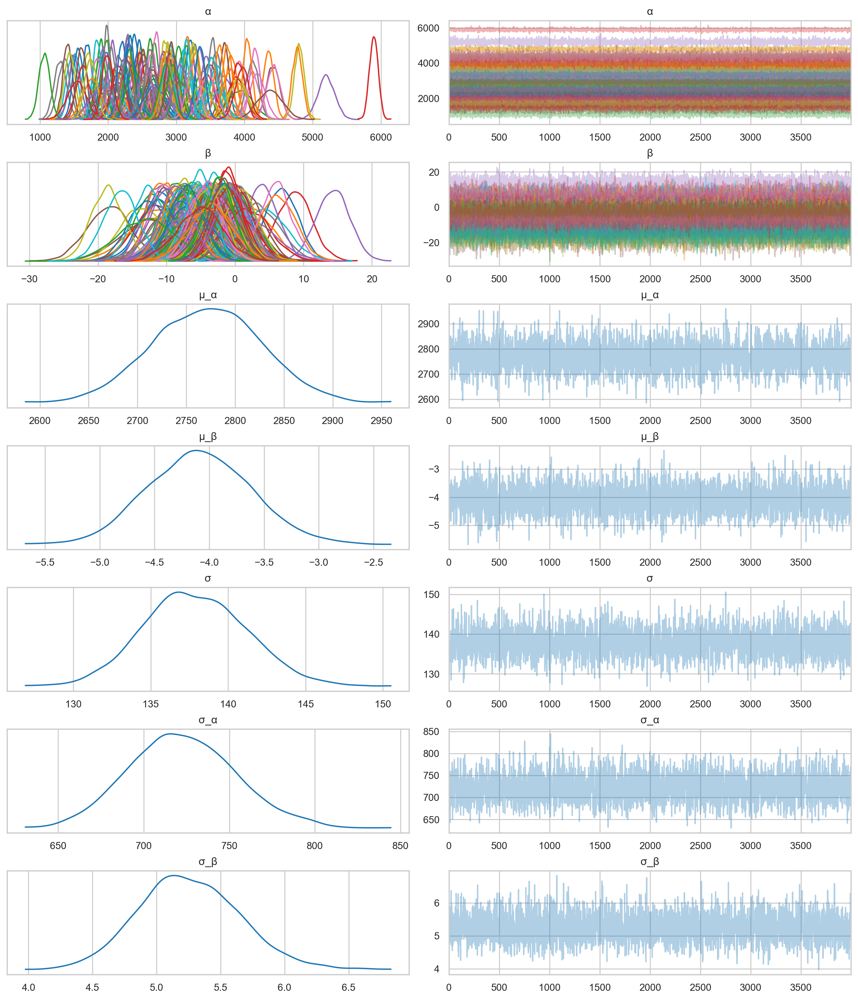

In [34]:
predictive_final = Predictive(paritally_pooled_model, mcmc_final.get_samples())
az.plot_trace(az.from_numpyro(mcmc_final), compact=True);

Getting Mse and Coverage

In [35]:
predictive_hierarchical = Predictive(paritally_pooled_model, mcmc_final.get_samples())

predictions_train_hierarchical = predictive_final(rng_key,
                                sample_weeks = model_kwargs_train["sample_weeks"],
                                sample_patient_code = model_kwargs_train["sample_patient_code"])['fvc']

mu_predictions_train_h = predictions_train_hierarchical.mean(axis=0)
std_predictions_train_h = predictions_train_hierarchical.std(axis=0)

maes["Hierarchical on train"] = mean_absolute_error(y_train, mu_predictions_train_h)

coverages["Hierarchical on train"] = coverage(y_train, mu_predictions_train_h, std_predictions_train_h).item()

predictions_test_hierarchical = predictive_final(rng_key,
                                sample_weeks = model_kwargs_test["sample_weeks"],
                                sample_patient_code = model_kwargs_test["sample_patient_code"])['fvc']

mu_predictions_test_h = predictions_test_hierarchical.mean(axis=0)
std_predictions_test_h = predictions_test_hierarchical.std(axis=0)

maes["Hierarchical on test"] = mean_absolute_error(y_test, mu_predictions_test_h)

coverages["Hierarchical on test"] = coverage(y_test, mu_predictions_test_h, std_predictions_test_h).item()

In [36]:
maes

{'LinearRegression on train': 662.1236659544445,
 'LinearRegression on test': 626.3184730275215,
 'PooledModel on train': 661.24235853637,
 'PooledModel on test': 626.4491242439516,
 'Hierarchical on train': 80.57488639283507,
 'Hierarchical on test': 110.49720419606855}

In [37]:
coverages

{'LinearRegression on test': 0.9709677419354839,
 'LinearRegression on train': 0.9548022598870056,
 'PooledModel on test': 0.948387086391449,
 'PooledModel on train': 0.938660204410553,
 'Hierarchical on train': 0.9741727113723755,
 'Hierarchical on test': 0.9387096762657166}

In [38]:
# Predict for a given patient

def predict_final(patient_code):
    predictions = predictive_final(rng_key, all_weeks, patient_code)
    mu = predictions["fvc"].mean(axis=0)
    sigma = predictions["fvc"].std(axis=0)
    return mu, sigma

# Plot the predictions for a given patient
def plot_patient_final(patient_code):

    mu, sigma = predict_final(patient_code)
    plt.plot(all_weeks, mu)
    plt.fill_between(all_weeks, mu - sigma, mu + sigma, alpha=0.1)
    id_to_patient = patient_encoder.inverse_transform([patient_code])[0]

    patient_weeks = train[train["Patient"] == id_to_patient]["Weeks"]
    patient_fvc = train[train["Patient"] == id_to_patient]["FVC"]
    plt.scatter(patient_weeks, patient_fvc, alpha=0.5)
    plt.xlabel("Weeks")
    plt.ylabel("FVC")
    plt.title(patient_encoder.inverse_transform([patient_code])[0])

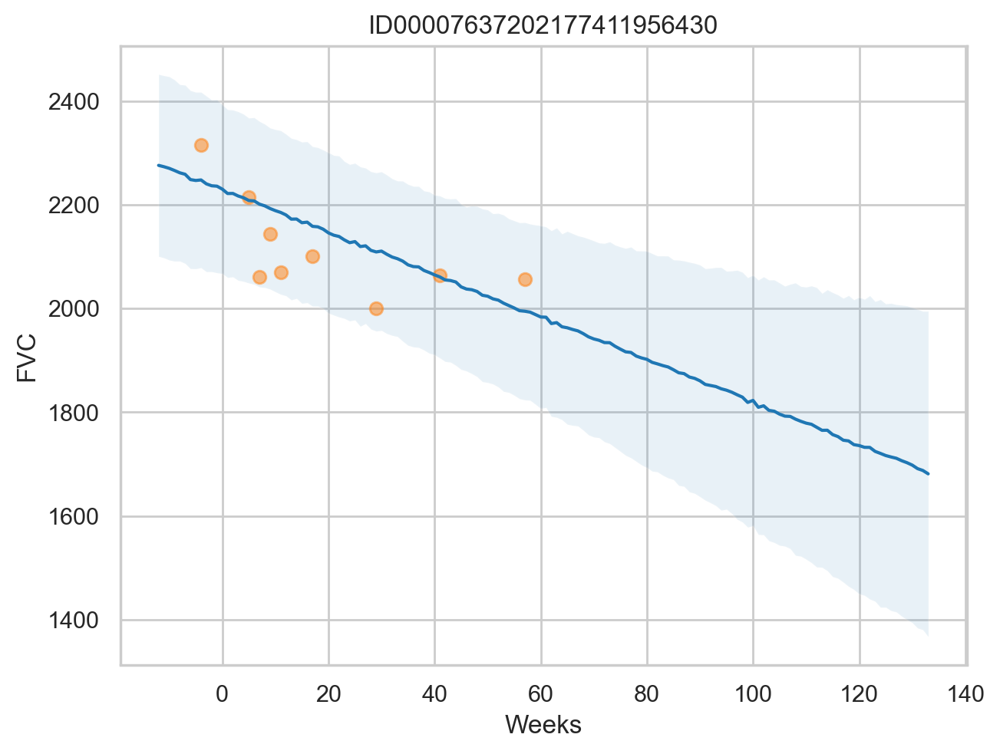

In [39]:
# plot for a given patient
plot_patient_final(np.array([0]))

### Partially pooled model with the sigma hyperpriors


\begin{align}
&\mu_{alpha} \sim  \text{Normal}(0, 500) \\
&\sigma_{alpha} \sim  \text{HalfNormal}(100) \\
&\mu_{beta} \sim  \text{Normal}(0, 500) \\
&\sigma_{beta} \sim  \text{HalfNormal}(100) \\
&\alpha \sim  \text{Normal}(mu_{alpha}, sigma_{alpha}) \\
&\beta \sim  \text{Normal}(mu_{beta}, sigma_{beta}) \\
&\gamma_{sigma} \sim \text{HalfNormal}(30) \\
&\sigma \sim  \text{Exp}(\gamma_{sigma}) \\
\end{align}

if i is the patient id, j is the week index

\begin{align}
FVC_{ij} \sim = \text{Normal}(\alpha_i + \beta_i \cdot Week_{j}, \sigma_i)
\end{align}

In [40]:
### Hierarchical model

def Partially_pooled_sigma_model(sample_weeks, sample_patient_code, sample_fvc=None):
    μ_α = numpyro.sample("μ_α", dist.Normal(0.0, 500.0))
    σ_α = numpyro.sample("σ_α", dist.HalfNormal(100.0))
    μ_β = numpyro.sample("μ_β", dist.Normal(0.0, 3.0))
    σ_β = numpyro.sample("σ_β", dist.HalfNormal(3.0))
    𝛄_σ = numpyro.sample("𝛄_σ", dist.HalfNormal(30.0))
    n_patients = len(np.unique(sample_patient_code))

    with numpyro.plate("Participants", n_patients):
        α = numpyro.sample("α", dist.Normal(μ_α, σ_α))
        β = numpyro.sample("β", dist.Normal(μ_β, σ_β))
        σ = numpyro.sample("σ", dist.Exponential(𝛄_σ))
    FVC_est = α[sample_patient_code] + β[sample_patient_code] * sample_weeks

    with numpyro.plate("data", len(sample_patient_code)):
        numpyro.sample("fvc", dist.Normal(FVC_est, σ[sample_patient_code]), obs=sample_fvc)

In [41]:
nuts_kernel = NUTS(Partially_pooled_sigma_model)

mcmc_3 = MCMC(nuts_kernel, num_samples=4000, num_warmup=2000)
rng_key = random.PRNGKey(0)

mcmc_3.run(rng_key, **model_kwargs_train)

sample: 100%|██████████| 6000/6000 [00:26<00:00, 224.98it/s, 63 steps of size 5.69e-02. acc. prob=0.87] 


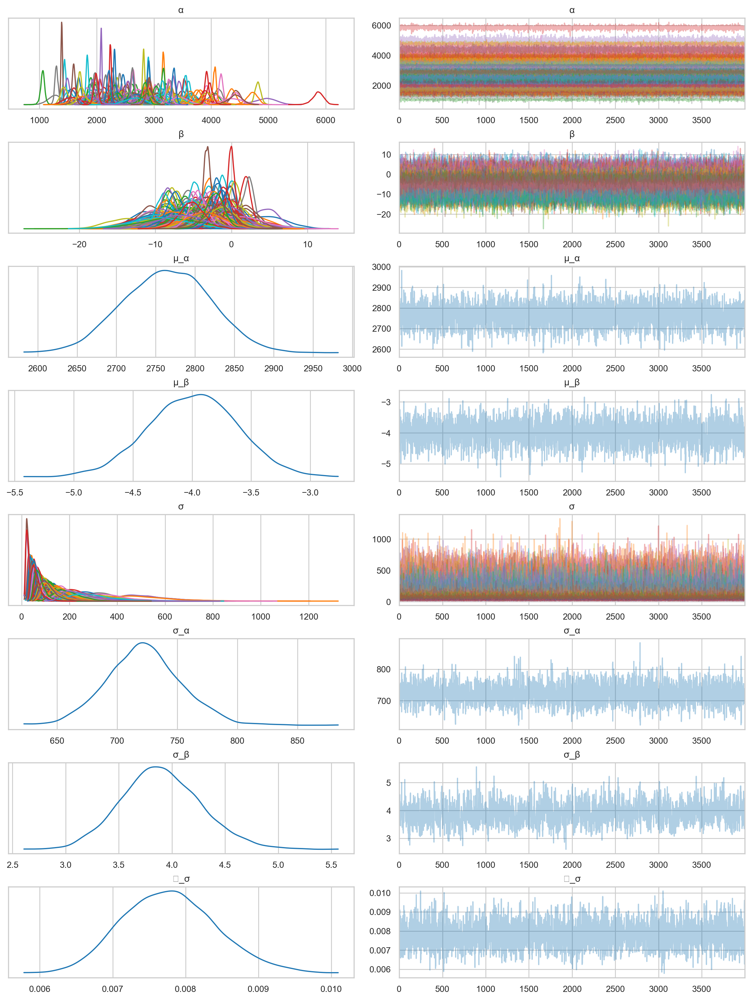

In [42]:
az.plot_trace(az.from_numpyro(mcmc_3), compact=True);

In [43]:
predictive = Predictive(Partially_pooled_sigma_model, mcmc_3.get_samples())

predictive_train_3 = predictive(rng_key,sample_weeks = model_kwargs_train["sample_weeks"],
                                sample_patient_code = model_kwargs_train["sample_patient_code"])['fvc']

mu_predictions_train_3 = predictive_train_3.mean(axis=0)
std_predictions_train_3 = predictive_train_3.std(axis=0)

maes["Hierarchial sigma train"] = mean_absolute_error(y_train, mu_predictions_train_3)
coverages["Hierarchial sigma train"] = coverage(y_train, mu_predictions_train_3, std_predictions_train_3).item()

predictive_test_3 = predictive(rng_key,sample_weeks = model_kwargs_test["sample_weeks"],
                               sample_patient_code = model_kwargs_test["sample_patient_code"])['fvc']

mu_predictions_test_3 = predictive_test_3.mean(axis=0)
std_predictions_test_3 = predictive_test_3.std(axis=0)

maes["Hierarchial sigma test"] = mean_absolute_error(y_test, mu_predictions_test_3)
coverages["Hierarchial sigma test"] = coverage(y_test, mu_predictions_test_3, std_predictions_test_3).item()

In [44]:
# Predict for a given patient
def predict_final_3(patient_code):
    predictions = predictive(rng_key, all_weeks, patient_code)
    mu = predictions["fvc"].mean(axis=0)
    sigma = predictions["fvc"].std(axis=0)
    return mu, sigma

# Plot the predictions for a given patient
def plot_patient_final_3(patient_code):
    mu, sigma = predict_final_3(patient_code)
    plt.plot(all_weeks, mu)
    plt.fill_between(all_weeks, mu - sigma, mu + sigma, alpha=0.1)
    id_to_patient = patient_encoder.inverse_transform([patient_code])[0]
    #print(id_to_patient[0], patient_code)
    #print(patient_code, id_to_patient)
    patient_weeks = train[train["Patient"] == id_to_patient]["Weeks"]
    patient_fvc = train[train["Patient"] == id_to_patient]["FVC"]
    plt.scatter(patient_weeks, patient_fvc, alpha=0.5)
    #plt.scatter(sample_weeks[train["patient_code"] == patient_code.item()], fvc[train["patient_code"] == patient_code.item()], alpha=0.5)
    plt.xlabel("Weeks")
    plt.ylabel("FVC")
    plt.title(patient_encoder.inverse_transform([patient_code])[0])

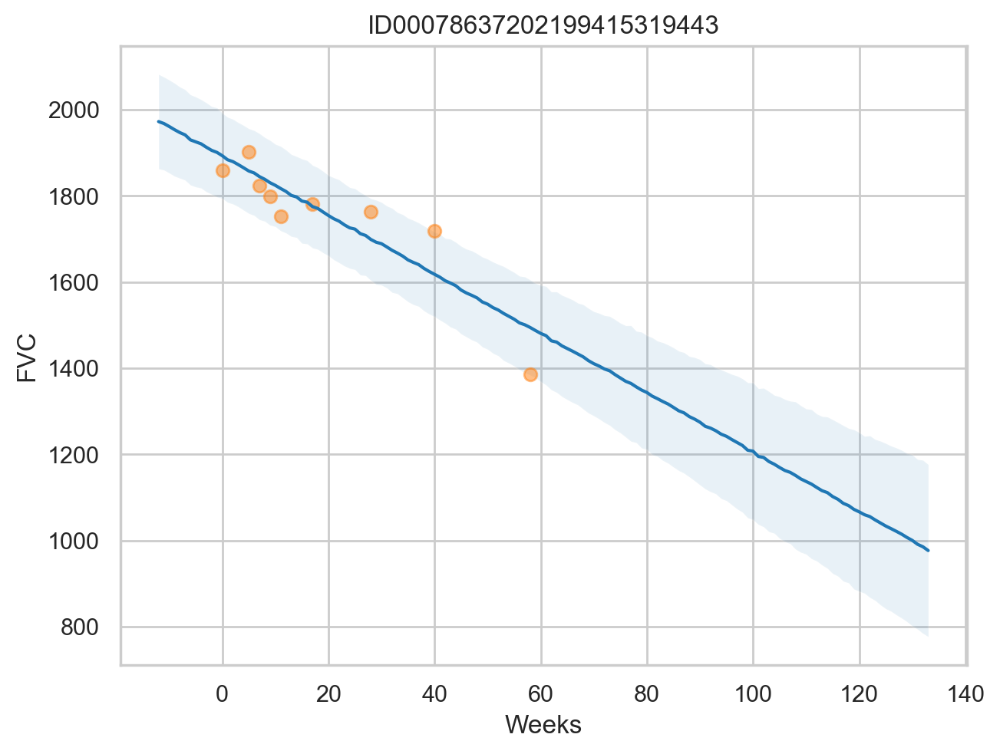

In [45]:
# plot for a given patient
plot_patient_final_3(np.array([32]))

In [48]:
pd.Series(maes)

LinearRegression on train    662.123666
LinearRegression on test     626.318473
PooledModel on train         661.242359
PooledModel on test          626.449124
Hierarchical on train         80.574886
Hierarchical on test         110.497204
Hierarchial sigma train       85.884296
Hierarchial sigma test       111.439091
dtype: float64

In [49]:
pd.Series(coverages)

LinearRegression on test     0.970968
LinearRegression on train    0.954802
PooledModel on test          0.948387
PooledModel on train         0.938660
Hierarchical on train        0.974173
Hierarchical on test         0.938710
Hierarchial sigma train      0.996772
Hierarchial sigma test       0.948387
dtype: float64

## Question 3 [4 Marks]

Use your version of following models to reproduce figure 4 from the paper referenced at [2].

You can also refer to the notebook in the course.

1) Hypernet [2 marks]
2) Neural Processes [2 marks]

---

## Hypernet

In [1]:
import torch
import os
import torchvision.datasets as datasets
import torchvision.transforms as transforms

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '0'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import os

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

# root = "/content/drive/MyDrive/Dataset/CelebA_Dataset"
root = "CelebA_Dataset"
celeba_dataset = []

for filename in os.listdir(root):
    if filename.endswith('.jpg'):
        image_path = os.path.join(root, filename)
        image = datasets.folder.default_loader(image_path)
        image = transform(image)
        celeba_dataset.append(image)

In [5]:
len(celeba_dataset)

1001

torch.Size([3, 64, 64])


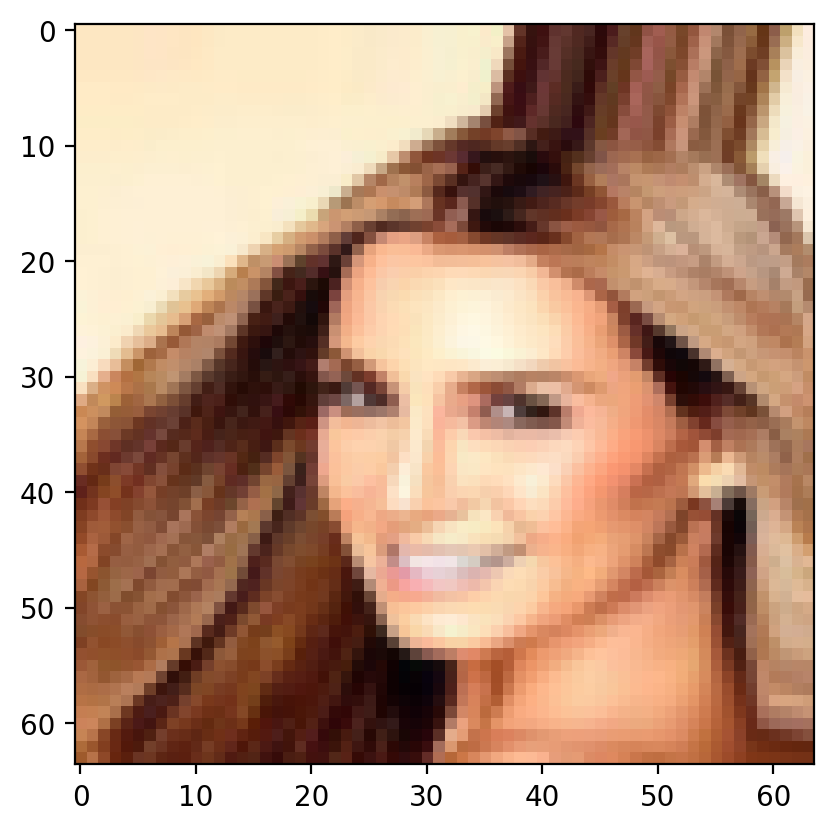

In [6]:
img0 = transform(datasets.folder.default_loader("CelebA_Dataset/000001.jpg"))
print(img0.shape)
plt.imshow(img0.permute(1,2,0))

In [7]:
from sklearn import preprocessing

def create_scaled_cmap(img, rt = False):
    """
    Creates a scaled image and a scaled colormap
    """
    img= img
    num_channels, height, width = img.shape

    # Create a 2D grid of (x,y) coordinates
    x_coords = torch.arange(width).repeat(height, 1)
    y_coords = torch.arange(height).repeat(width, 1).t()
    x_coords = x_coords.reshape(-1)
    y_coords = y_coords.reshape(-1)

    X = torch.stack([x_coords, y_coords], dim=1).float().to(device)
    # Y = img.permute(1, 2, 0).reshape(-1, num_channels).float().to(device)
    if rt == True:
      Y = img.permute(1, 2, 0).reshape(-1, num_channels).float().to(device)
    else:
      Y = img.reshape(-1, num_channels).float().to(device)

    scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(X.cpu())
    scaled_X = torch.tensor(scaler_X.transform(X.cpu())).to(device).float()

    return scaled_X, Y, scaler_X

In [8]:
img0_X, img0_Y, scaler_X = create_scaled_cmap(img0)
img0_X.shape, img0_Y.shape

(torch.Size([4096, 2]), torch.Size([4096, 3]))

In [9]:
s = 64

class NN(nn.Module):
    def _init_siren(self, activation_scale):
        self.fc1.weight.data.uniform_(-1/self.fc1.in_features, 1/self.fc1.in_features)
        for layers in [self.fc2, self.fc3, self.fc5]:
            layers.weight.data.uniform_(-np.sqrt(6/self.fc2.in_features)/activation_scale,
                                        np.sqrt(6/self.fc2.in_features)/activation_scale)

    def __init__(self, activation=torch.sin, n_out=3, activation_scale=1.0):
        super().__init__()
        self.activation = activation
        self.activation_scale = activation_scale
        self.fc1 = nn.Linear(2, s)
        self.fc2 = nn.Linear(s, s)
        self.fc3 = nn.Linear(s, s)
        self.fc5 = nn.Linear(s, 3) #gray scale image (1) or RGB (3)
        if self.activation == torch.sin:
            # init weights and biases for sine activation
            self._init_siren(activation_scale=self.activation_scale)

    def forward(self, x):
        x = self.activation(self.activation_scale*self.fc1(x))
        x = self.activation(self.activation_scale*self.fc2(x))
        x = self.activation(self.activation_scale*self.fc3(x))
        # x = self.activation(self.activation_scale*self.fc4(x))
        return self.fc5(x)

## Trying only the normal neural net Relu and Sin activations

This will act as our Target net

In [10]:
# Making singular data for only 1 image
torch.manual_seed(0)
sh_index = torch.randperm(img0_X.shape[0])

# Shuffle the dataset
img0_X_sh = img0_X[sh_index]
img0_Y_sh = img0_Y[sh_index]
sh_index[0:10]

tensor([2732, 1810, 3111, 2738,  155, 2864, 2423, 2918, 2441, 3201])

In [11]:
torch.manual_seed(0)

nns = {}
nns["img0"] = {}
nns["img0"]["relu"] = NN(activation=torch.relu, n_out=3).to(device)
nns["img0"]["sin"] = NN(activation=torch.sin, n_out=3, activation_scale=30.0).to(device)

In [12]:
nns["img0"]["relu"](img0_X_sh).shape, nns["img0"]["sin"](img0_X_sh).shape

(torch.Size([4096, 3]), torch.Size([4096, 3]))

In [13]:
# Training the network to recreate the image
def train_normalnet(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)

        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    return loss.item()

---
---

In [ ]:
import time
n_iter = 2000

start_time = time.time()

train_normalnet(nns["img0"]["relu"], lr=3e-4, X=img0_X_sh, Y=img0_Y_sh, epochs=n_iter)
end_time = time.time()

print(f"Training time: {end_time-start_time:.2f} seconds")

Epoch 0 loss: 0.330164
Epoch 100 loss: 0.072692
Epoch 200 loss: 0.071209
Epoch 300 loss: 0.070467
Epoch 400 loss: 0.069878
Epoch 500 loss: 0.069198
Epoch 600 loss: 0.068229
Epoch 700 loss: 0.066728
Epoch 800 loss: 0.064489
Epoch 900 loss: 0.061017
Epoch 1000 loss: 0.055909
Epoch 1100 loss: 0.050226
Epoch 1200 loss: 0.045593
Epoch 1300 loss: 0.042071
Epoch 1400 loss: 0.039665
Epoch 1500 loss: 0.037875
Epoch 1600 loss: 0.036552
Epoch 1700 loss: 0.035374
Epoch 1800 loss: 0.034569
Epoch 1900 loss: 0.033748
Training time: 3.97 seconds


torch.Size([4096, 3])


Text(0.5, 1.0, 'Reconstructed Relu Image')

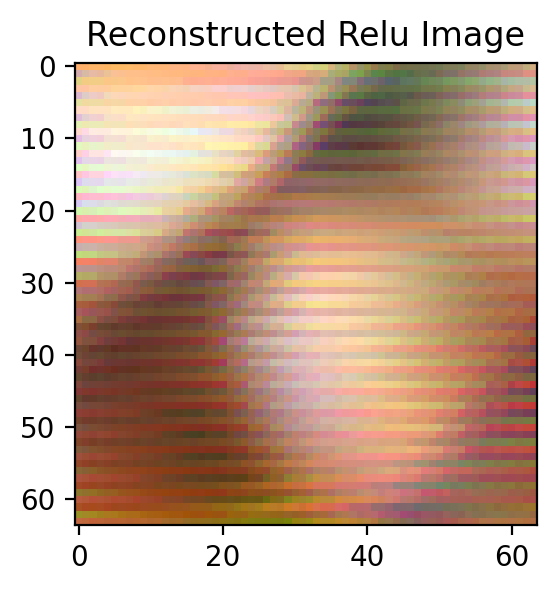

In [ ]:
output = nns["img0"]["relu"](img0_X)#.detach().cpu().numpy()
print(output.shape)
num_channels, height, width = img0.shape

output = output.reshape(num_channels, height, width)
output = output.permute(1, 2, 0)

fig, ax = plt.subplots(figsize=(4, 3))
ax.imshow(output.detach().cpu())
ax.set_title("Reconstructed Relu Image")

In [ ]:
import time
n_iter = 2000

start_time = time.time()

train_normalnet(nns["img0"]["sin"], lr=3e-4, X=img0_X_sh, Y=img0_Y_sh, epochs=n_iter)
end_time = time.time()

print(f"Training time: {end_time-start_time:.2f} seconds")

Epoch 0 loss: 0.393856
Epoch 100 loss: 0.012778
Epoch 200 loss: 0.007427
Epoch 300 loss: 0.005406
Epoch 400 loss: 0.004122
Epoch 500 loss: 0.003208
Epoch 600 loss: 0.002511
Epoch 700 loss: 0.001977
Epoch 800 loss: 0.001601
Epoch 900 loss: 0.001339
Epoch 1000 loss: 0.001124
Epoch 1100 loss: 0.000962
Epoch 1200 loss: 0.000838
Epoch 1300 loss: 0.000752
Epoch 1400 loss: 0.000663
Epoch 1500 loss: 0.000605
Epoch 1600 loss: 0.000568
Epoch 1700 loss: 0.000524
Epoch 1800 loss: 0.000518
Epoch 1900 loss: 0.000470
Training time: 3.48 seconds


torch.Size([4096, 3])


Text(0.5, 1.0, 'Reconstructed Image Siren')

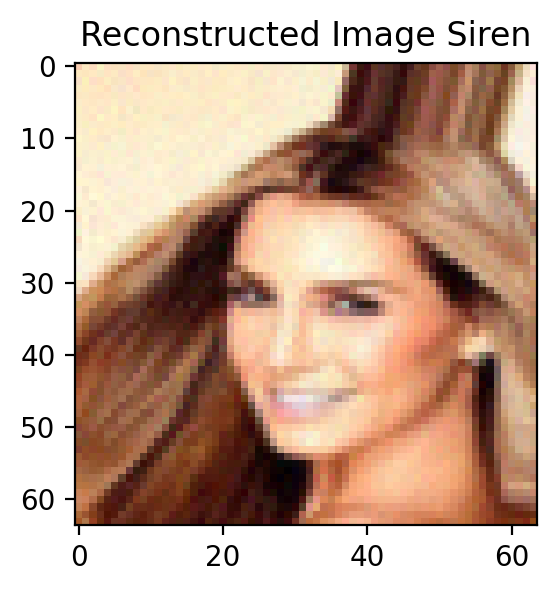

In [ ]:
output = nns["img0"]["sin"](img0_X)#.detach().cpu().numpy()
print(output.shape)
num_channels, height, width = img0.shape

output = output.reshape(num_channels, height, width)
output = output.permute(1, 2, 0)

fig, ax = plt.subplots(figsize=(4, 3))
ax.imshow(output.detach().cpu())
ax.set_title("Reconstructed Image Siren")

## Making a Hypernet and training it on only 1 image

In [14]:
# Here we are looking at the composition of our target net, The hypernet should be able to
# produce those many features for these parameters

try:
    from tabulate import tabulate
except:
    %pip install tabulate
    from tabulate import tabulate

model = nns["img0"]["sin"]

table_data = []

total_params = 0
start = 0
start_end_mapping = {}
for name, param in model.named_parameters():
    param_count = torch.prod(torch.tensor(param.shape)).item()
    total_params += param_count
    end = total_params
    table_data.append([name, param.shape, param_count, start, end])
    start_end_mapping[name] = (start, end)
    start = end

print(tabulate(table_data, headers=["Layer Name", "Shape", "Parameter Count", "Start Index", "End Index"]))
print(f"Total number of parameters: {total_params}")

  Using cached tabulate-0.9.0-py3-none-any.whl (35 kB)
Note: you may need to restart the kernel to use updated packages.
Layer Name    Shape                   Parameter Count    Start Index    End Index
------------  --------------------  -----------------  -------------  -----------
fc1.weight    torch.Size([64, 2])                 128              0          128
fc1.bias      torch.Size([64])                     64            128          192
fc2.weight    torch.Size([64, 64])               4096            192         4288
fc2.bias      torch.Size([64])                     64           4288         4352
fc3.weight    torch.Size([64, 64])               4096           4352         8448
fc3.bias      torch.Size([64])                     64           8448         8512
fc5.weight    torch.Size([3, 64])                 192           8512         8704
fc5.bias      torch.Size([3])                       3           8704         8707
Total number of parameters: 8707


In [15]:
# Hypernet class

total_params=8707
ss=256

class HyperNet(nn.Module):
    def __init__(self, num_layers=5, num_neurons=256, activation=torch.sin, n_out=3):
        super().__init__()
        self.activation = activation
        self.n_out = total_params
        self.fc1 = nn.Linear(5, ss)
        self.fc2 = nn.Linear(ss, ss)
        self.fc3 = nn.Linear(ss, total_params)

    def forward(self, x):
        x = self.activation(self.fc1(x))
        x = self.activation(self.fc2(x))
        return self.fc3(x)

In [16]:
hp = HyperNet().to(device)

out_hp = hp(torch.rand(10, 5).to(device))
print(out_hp.shape)

weights_flattened  = out_hp.mean(dim=0)
print(weights_flattened.shape)

print(hp(torch.rand(2000, 5).to(device)).shape)

torch.Size([10, 8707])
torch.Size([8707])
torch.Size([2000, 8707])


In [17]:
torch.manual_seed(42)
img0_X, img0_Y, scaler_X = create_scaled_cmap(img0, rt = False)
img0_X.shape, img0_Y.shape

img0_hyper_data = []
datano = 1 #instead of 20 images
context_precent = 100 # increased the context size to 10 percent

for i in range(datano):
    sh_indexi = torch.randperm(img0_X.shape[0])
    cont_img0_X_shi = img0_X[sh_indexi][0:int(len(img0_X)*context_precent/100)]
    cont_img0_Y_shi = img0_Y[sh_indexi][0:int(len(img0_X)*context_precent/100)]
    context_data = torch.cat((cont_img0_X_shi, cont_img0_Y_shi), dim = 1)

    train_img0_X_shi = img0_X
    train_img0_Y_shi = img0_Y

    datas = [context_data, train_img0_X_shi, train_img0_Y_shi]
    img0_hyper_data.append(datas)

In [18]:
img0_hyper_data = []
img0_hyper_data.append([torch.cat((img0_X, img0_Y), dim = 1), img0_X, img0_Y])

In [19]:
img0_hyper_data[0][0].shape, img0_hyper_data[0][1].shape, img0_hyper_data[0][2].shape

(torch.Size([4096, 5]), torch.Size([4096, 2]), torch.Size([4096, 3]))

In [20]:
params2 = hp(img0_hyper_data[0][0]).mean(dim=0)
params2.shape, img0_hyper_data[0][0].shape

(torch.Size([8707]), torch.Size([4096, 5]))

In [21]:
model = NN(activation=torch.sin, n_out=3, activation_scale=30.0).to(device)
model

NN(
  (fc1): Linear(in_features=2, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=64, bias=True)
  (fc5): Linear(in_features=64, out_features=3, bias=True)
)

In [23]:
# Installing the astra library
! pip install astra-lib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.6/136.6 kB 4.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Obtaining dependency information for optree from https://files.pythonhosted.org/packages/2f/42/55d53ab2d36342459ea9fa7451d9744b275103f2409f25ee2c802c45541e/optree-0.10.0-cp311-cp311-macosx_10_9_x86_64.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.3/45.3 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 269.4/269.4 kB 14.0 MB/s eta 0:00:00
  Created wheel for astra-lib: filename=astra_lib-0.0.2-py3-none-any.whl size=21845 sha256=be67a605a894d3c82d104c9d30b670ce832197337b8e207d257d030051da5ef7
  Stored in directory: /Users/gaurav/Library/Caches/pip/wheels/5f/c0/d6/33c73e3b62aa35706c1796f419ee7712f3c1529f54eb5219a9
Successfully built astra-lib


In [24]:
import astra
from astra.torch.utils import ravel_pytree
flat_weights, unravel_fn = ravel_pytree(dict(model.named_parameters()))
print(flat_weights.shape)

torch.Size([8707])


In [25]:
unravel_fn

<function astra.torch.utils.ravel_pytree.<locals>.unravel_function(flat_params)>

In [26]:
# Training the network to recreate the image
torch.manual_seed(42)

# targetnet = NN(activation=torch.sin, n_out=3, activation_scale=30.0).to(device) # Target Net
# new_dict = targetnet.state_dict()

def train_hypernet(hypernet, target_net, lr, hyper_data, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    loss_list = []
    datano = len(hyper_data)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(hypernet.parameters(), lr=lr)

    for epoch in range(epochs):
        running_loss = 0.0
        for i in range(datano):
            context_data, train_img_X_shi, train_img_Y_shi = hyper_data[i]

            optimizer.zero_grad()
            output = hypernet(context_data)
            params = output.mean(dim=0)

            flat_weights, unravel_fn = ravel_pytree(dict(target_net.named_parameters()))
            new_dict = unravel_fn(params)

            # new_dict.update(unravel_fn(params))

            outputs = torch.func.functional_call(target_net, new_dict, train_img_X_shi)

            loss = criterion(outputs, train_img_Y_shi)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        loss_list.append(running_loss)

        if verbose and epoch % 50 == 0:
            # Values are not chaninging ? why?
            # print(hypernet.state_dict()["fc1.weight"][0:2, 0:2])
            print(f"Epoch {epoch} loss: {running_loss/datano:.6f}")

    return loss_list

---
---

In [ ]:
import time
torch.manual_seed(42)

start_time = time.time()
hp1 = HyperNet(activation = nn.ReLU() ).to(device)
targetnet1 = NN().to(device)
loss_list = train_hypernet(hp1, targetnet1, lr = 3e-4, hyper_data = img0_hyper_data, epochs = 15000, verbose=True)
# reduced learning rate
end_time = time.time()

print(f"Training time: {end_time-start_time:.2f} seconds")

Epoch 0 loss: 0.403650
Epoch 50 loss: 0.071302
Epoch 100 loss: 0.071194
Epoch 150 loss: 0.071189
Epoch 200 loss: 0.071183
Epoch 250 loss: 0.071176
Epoch 300 loss: 0.071166
Epoch 350 loss: 0.071154
Epoch 400 loss: 0.071146
Epoch 450 loss: 0.071144
Epoch 500 loss: 0.071142
Epoch 550 loss: 0.071140
Epoch 600 loss: 0.071138
Epoch 650 loss: 0.071136
Epoch 700 loss: 0.071135
Epoch 750 loss: 0.071133
Epoch 800 loss: 0.071132
Epoch 850 loss: 0.071130
Epoch 900 loss: 0.071129
Epoch 950 loss: 0.071127
Epoch 1000 loss: 0.071126
Epoch 1050 loss: 0.071128
Epoch 1100 loss: 0.071125
Epoch 1150 loss: 0.071124
Epoch 1200 loss: 0.071129
Epoch 1250 loss: 0.071126
Epoch 1300 loss: 0.071125
Epoch 1350 loss: 0.071124
Epoch 1400 loss: 0.071123
Epoch 1450 loss: 0.071122
Epoch 1500 loss: 0.071511
Epoch 1550 loss: 0.071131
Epoch 1600 loss: 0.071128
Epoch 1650 loss: 0.071126
Epoch 1700 loss: 0.071125
Epoch 1750 loss: 0.071124
Epoch 1800 loss: 0.071123
Epoch 1850 loss: 0.071122
Epoch 1900 loss: 0.071121
Epoch 195

In [ ]:
loss_list2 = train_hypernet(hp1, targetnet1, lr = 3e-4, hyper_data = img0_hyper_data, epochs = 10000, verbose=True)

Epoch 0 loss: 0.009098
Epoch 50 loss: 0.013128
Epoch 100 loss: 0.009980
Epoch 150 loss: 0.009274
Epoch 200 loss: 0.009523
Epoch 250 loss: 0.009007
Epoch 300 loss: 0.008988
Epoch 350 loss: 0.009015
Epoch 400 loss: 0.009092
Epoch 450 loss: 0.009587
Epoch 500 loss: 0.008949
Epoch 550 loss: 0.009135
Epoch 600 loss: 0.009011
Epoch 650 loss: 0.008903
Epoch 700 loss: 0.008935
Epoch 750 loss: 0.009252
Epoch 800 loss: 0.009137
Epoch 850 loss: 0.008866
Epoch 900 loss: 0.009325
Epoch 950 loss: 0.009051
Epoch 1000 loss: 0.008735
Epoch 1050 loss: 0.008841
Epoch 1100 loss: 0.009356
Epoch 1150 loss: 0.008910
Epoch 1200 loss: 0.008656
Epoch 1250 loss: 0.008877
Epoch 1300 loss: 0.008681
Epoch 1350 loss: 0.008711
Epoch 1400 loss: 0.009730
Epoch 1450 loss: 0.009411
Epoch 1500 loss: 0.008878
Epoch 1550 loss: 0.008693
Epoch 1600 loss: 0.009151
Epoch 1650 loss: 0.008871
Epoch 1700 loss: 0.008522
Epoch 1750 loss: 0.008817
Epoch 1800 loss: 0.008764
Epoch 1850 loss: 0.008510
Epoch 1900 loss: 0.008537
Epoch 195

Text(0, 0.5, 'loss')

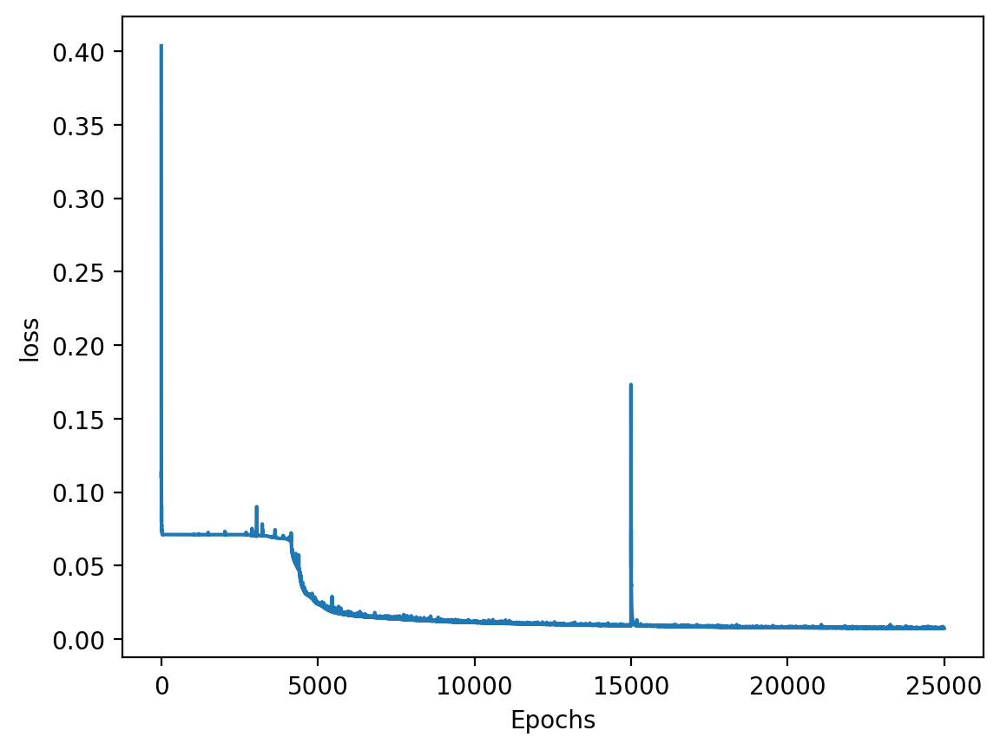

In [ ]:
loss_list.extend(loss_list2)
plt.plot(loss_list[:25000])
plt.xlabel("Epochs")
plt.ylabel("loss")

In [ ]:
torch.save(hp1.state_dict(), "img0_hypernet.pt")

---

In [32]:
hp1 = HyperNet(activation = nn.ReLU() ).to(device)
hp1.load_state_dict(torch.load("img0_hypernet.pt", map_location=torch.device('cpu')))

targetnet1 = NN().to(device)

In [37]:
def plot_reconstructed_and_original_image(original_img, hypernet, targetnet, X, context, title=""):
    """
    original_img = Original image
    Hypernet = hypernet
    targetnet = targetnet
    X = the full scaled image X
    context = (n,5) shaped context
    """
    # num_channels, height, width = original_img.shape

    num_channels, height, width = original_img.shape

    with torch.no_grad():
        params = hypernet(context).mean(dim=0)

        flat_weights,unravel_fn= ravel_pytree(dict(targetnet.named_parameters()))

        parameter_dictionary = unravel_fn(params)

        outputs = torch.func.functional_call(targetnet, parameter_dictionary, X)
        # print(output.shape)
        outputs = outputs.reshape(num_channels, height, width)
        outputs = outputs.permute(1, 2, 0)

    fig = plt.figure(figsize=(8, 6))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.detach().cpu().numpy())
    ax0.set_title("Reconstructed Image")


    ax1.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Original Image")

    for a in [ax0, ax1]:
        a.axis("off")


    fig.suptitle(title, y=0.9)
    plt.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


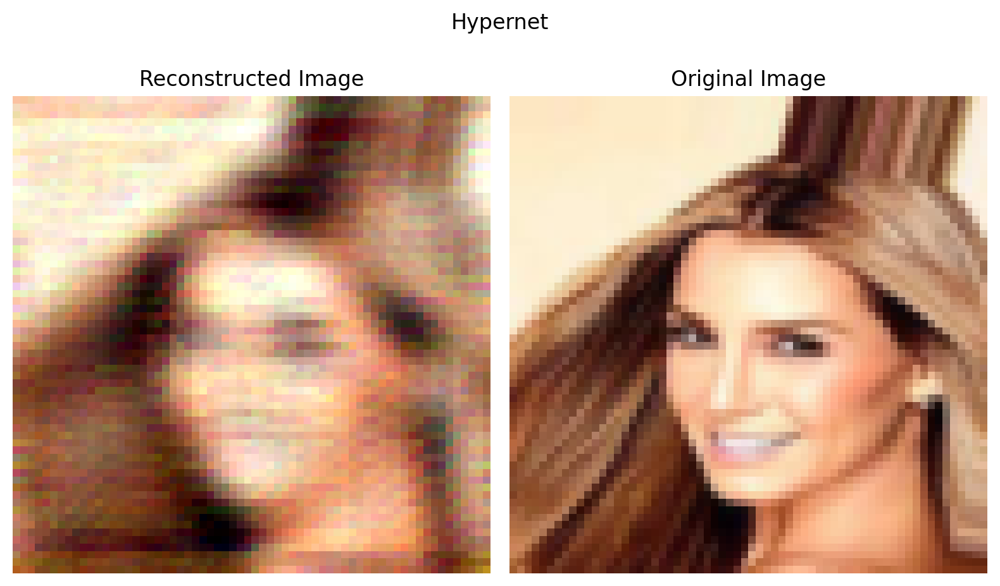

In [38]:
context = torch.cat((img0_X, img0_Y), dim = 1)
plot_reconstructed_and_original_image(img0, hp1, targetnet1, img0_X, context, title="Hypernet")

torch.Size([64, 64, 3])


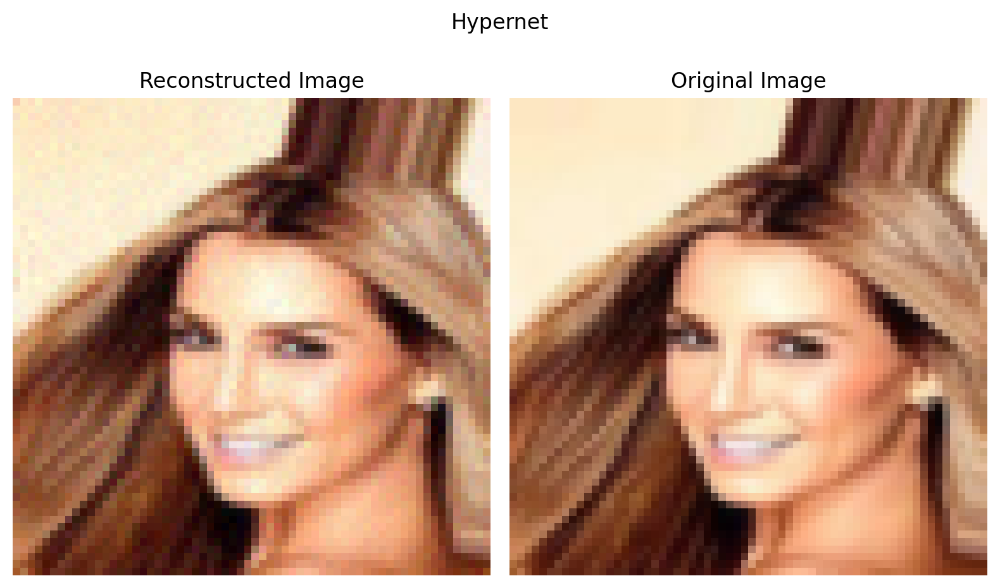

In [ ]:
context = torch.cat((img0_X, img0_Y), dim = 1)
plot_reconstructed_and_original_image(img0, hp1, targetnet1, img0_X, context, title="Hypernet")

### Training 5 Batches of 1 image

In [39]:
torch.manual_seed(42)
img0_X, img0_Y, scaler_X = create_scaled_cmap(img0, rt = False)
img0_X.shape, img0_Y.shape

img0_hyper_data2 = []
datano = 5 #instead of 20 images
context_precent_start = 10 # increased the context size to 10 percent
context_percent_end = 80

for i in range(datano):
    contextp = context_precent_start + (i/datano)*(context_percent_end-context_precent_start)
    sh_indexi = torch.randperm(img0_X.shape[0])
    cont_img0_X_shi = img0_X[sh_indexi][0:int(len(img0_X)*contextp/100)]
    cont_img0_Y_shi = img0_Y[sh_indexi][0:int(len(img0_X)*contextp/100)]
    context_data = torch.cat((cont_img0_X_shi, cont_img0_Y_shi), dim = 1)

    train_img0_X_shi = img0_X
    train_img0_Y_shi = img0_Y

    datas = [context_data, train_img0_X_shi, train_img0_Y_shi]
    img0_hyper_data2.append(datas)

In [40]:
img0_hyper_data2[1][0].shape, img0_hyper_data2[1][1].shape, img0_hyper_data2[1][1].shape

(torch.Size([983, 5]), torch.Size([4096, 2]), torch.Size([4096, 2]))

---
---
---

In [ ]:
import time
torch.manual_seed(42)

start_time = time.time()
hp_img2 = HyperNet(activation = nn.ReLU() ).to(device)
targetnet_img2 = NN().to(device)
loss_list_img2 = train_hypernet(hp_img2, targetnet_img2, lr = 3e-4, hyper_data = img0_hyper_data2, epochs = 10000, verbose=True)
# reduced learning rate
end_time = time.time()

print(f"Training time: {end_time-start_time:.2f} seconds")

Epoch 0 loss: 0.192977
Epoch 50 loss: 0.071178
Epoch 100 loss: 0.071160
Epoch 150 loss: 0.071141
Epoch 200 loss: 0.071152
Epoch 250 loss: 0.071129
Epoch 300 loss: 0.071131
Epoch 350 loss: 0.071149
Epoch 400 loss: 0.071139
Epoch 450 loss: 0.071147
Epoch 500 loss: 0.071271
Epoch 550 loss: 0.071155
Epoch 600 loss: 0.069042
Epoch 650 loss: 0.068657
Epoch 700 loss: 0.055331
Epoch 750 loss: 0.036802
Epoch 800 loss: 0.034901
Epoch 850 loss: 0.028884
Epoch 900 loss: 0.026838
Epoch 950 loss: 0.025977
Epoch 1000 loss: 0.026541
Epoch 1050 loss: 0.022476
Epoch 1100 loss: 0.021346
Epoch 1150 loss: 0.019726
Epoch 1200 loss: 0.021250
Epoch 1250 loss: 0.017727
Epoch 1300 loss: 0.017597
Epoch 1350 loss: 0.017356
Epoch 1400 loss: 0.017615
Epoch 1450 loss: 0.017500
Epoch 1500 loss: 0.015576
Epoch 1550 loss: 0.015585
Epoch 1600 loss: 0.014925
Epoch 1650 loss: 0.014785
Epoch 1700 loss: 0.014516
Epoch 1750 loss: 0.014382
Epoch 1800 loss: 0.014247
Epoch 1850 loss: 0.013916
Epoch 1900 loss: 0.013573
Epoch 195

In [ ]:
test_contextp = 1
sh_indexi = torch.randperm(img0_X.shape[0])
test_cont_img0_X = img0_X[sh_indexi][0:int(len(img0_X)*test_contextp/100)]
test_cont_img0_Y = img0_Y[sh_indexi][0:int(len(img0_X)*test_contextp/100)]
test_context_data = torch.cat((test_cont_img0_X, test_cont_img0_Y), dim = 1)
test_context_data.shape

torch.Size([40, 5])

torch.Size([64, 64, 3])


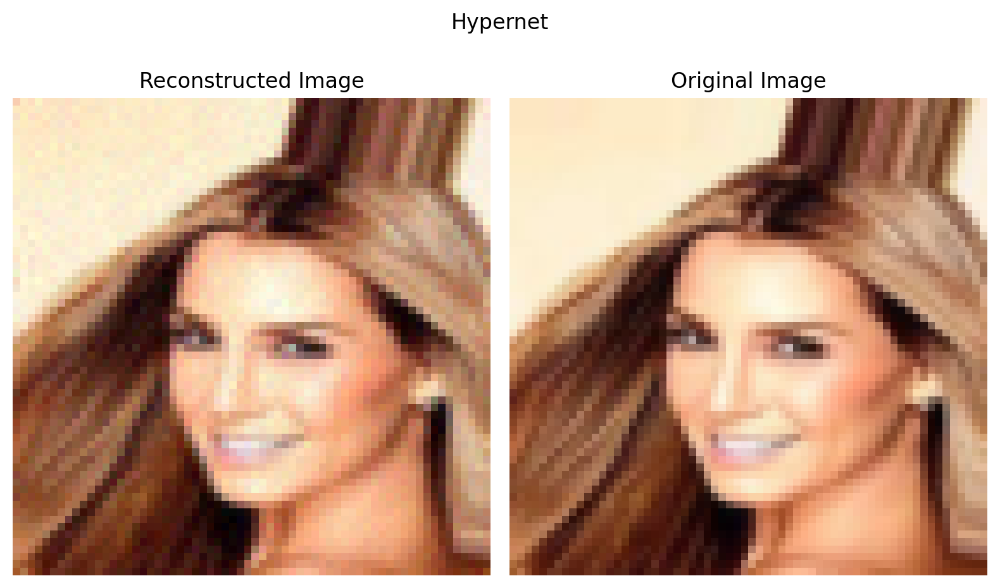

In [ ]:
plot_reconstructed_and_original_image(img0, hp_img2, targetnet_img2, img0_X, test_context_data, title="Hypernet")

## Images of 50 celebrities, 50 images each

In [41]:
torch.manual_seed(42)
img0_X, img0_Y, scaler_X = create_scaled_cmap(img0, rt = False)
img0_X.shape, img0_Y.shape

no_of_images = 50

images_hyper_data = []
datano = 4 #instead of 20 images
context_precent_start = 10 # increased the context size to 10 percent
context_percent_end = 50

for celebno in range(no_of_images):
  image_X, image_Y, scaler_X = create_scaled_cmap(celeba_dataset[celebno], rt = False)
  for i in range(datano):
      contextp = context_precent_start + (i/datano)*(context_percent_end-context_precent_start)
      sh_indexi = torch.randperm(image_X.shape[0])
      cont_img0_X_shi = image_X[sh_indexi][0:int(len(img0_X)*contextp/100)]
      cont_img0_Y_shi = image_Y[sh_indexi][0:int(len(img0_X)*contextp/100)]
      context_data = torch.cat((cont_img0_X_shi, cont_img0_Y_shi), dim = 1)

      train_img0_X_shi = image_X
      train_img0_Y_shi = image_Y

      datas = [context_data, train_img0_X_shi, train_img0_Y_shi]
      images_hyper_data.append(datas)


In [42]:
len(images_hyper_data), images_hyper_data[0][0].shape, images_hyper_data[0][1].shape, images_hyper_data[0][2].shape

(200, torch.Size([409, 5]), torch.Size([4096, 2]), torch.Size([4096, 3]))

---
---
---

In [ ]:
import time
torch.manual_seed(42)

start_time = time.time()
celeb_hp = HyperNet(activation = nn.ReLU() ).to(device)
celeb_targetnet = NN().to(device)
celeb_loss_list = train_hypernet(celeb_hp, celeb_targetnet, lr = 3e-4, hyper_data = images_hyper_data, epochs = 4500, verbose=True)
# reduced learning rate
end_time = time.time()

print(f"Training time: {end_time-start_time:.2f} seconds")

Epoch 0 loss: 0.072027
Epoch 50 loss: 0.060346
Epoch 100 loss: 0.060094
Epoch 150 loss: 0.059345
Epoch 200 loss: 0.059046
Epoch 250 loss: 0.057511
Epoch 300 loss: 0.057402
Epoch 350 loss: 0.056238
Epoch 400 loss: 0.055600
Epoch 450 loss: 0.055547
Epoch 500 loss: 0.055558
Epoch 550 loss: 0.054876
Epoch 600 loss: 0.054605
Epoch 650 loss: 0.053750
Epoch 700 loss: 0.052658
Epoch 750 loss: 0.052339
Epoch 800 loss: 0.051500
Epoch 850 loss: 0.051287
Epoch 900 loss: 0.050553
Epoch 950 loss: 0.050224
Epoch 1000 loss: 0.049445
Epoch 1050 loss: 0.049254
Epoch 1100 loss: 0.048603
Epoch 1150 loss: 0.048420
Epoch 1200 loss: 0.047918
Epoch 1250 loss: 0.047415
Epoch 1300 loss: 0.046563
Epoch 1350 loss: 0.045343
Epoch 1400 loss: 0.044586
Epoch 1450 loss: 0.043709
Epoch 1500 loss: 0.040924
Epoch 1550 loss: 0.040019
Epoch 1600 loss: 0.038758
Epoch 1650 loss: 0.037633
Epoch 1700 loss: 0.037167
Epoch 1750 loss: 0.036234
Epoch 1800 loss: 0.035238
Epoch 1850 loss: 0.034266
Epoch 1900 loss: 0.033301
Epoch 195

KeyboardInterrupt: ignored

In [ ]:
torch.save(celeb_hp.state_dict(), "celeb_hp_hypernet.pt")

In [ ]:
torch.save(celeb_hp.state_dict(), "celeb_hp_hypernet.pt")

In [43]:
celeb_hp = HyperNet(activation = nn.ReLU() ).to(device)
celeb_hp.load_state_dict(torch.load("celeb_hp_hypernet.pt", map_location=torch.device('cpu')))

FileNotFoundError: [Errno 2] No such file or directory: 'celeb_hp_hypernet.pt'

In [ ]:
# plt.plot(celeb_loss_list)
# plt.xlabel("Epochs")
# plt.ylabel("loss")

In [ ]:
test_contextp = 50
celebno = 2
image_X, image_Y, scaler_X = create_scaled_cmap(celeba_dataset[celebno], rt = False)

sh_indexi = torch.randperm(img0_X.shape[0])
test_cont_img0_X = image_X[sh_indexi][0:int(len(img0_X)*test_contextp/100)]
test_cont_img0_Y = image_Y[sh_indexi][0:int(len(img0_X)*test_contextp/100)]
test_context_data = torch.cat((test_cont_img0_X, test_cont_img0_Y), dim = 1)
test_context_data.shape

torch.Size([2048, 5])

In [ ]:
params = celeb_hp(test_context_data).mean(dim=0)
params.shape

torch.Size([8707])

In [ ]:
flat_weights,unravel_fn= ravel_pytree(dict(celeb_targetnet.named_parameters()))
parameter_dictionary = unravel_fn(params)

outputs = torch.func.functional_call(celeb_targetnet, parameter_dictionary, img0_X)
print(output.shape)

torch.Size([64, 64, 3])


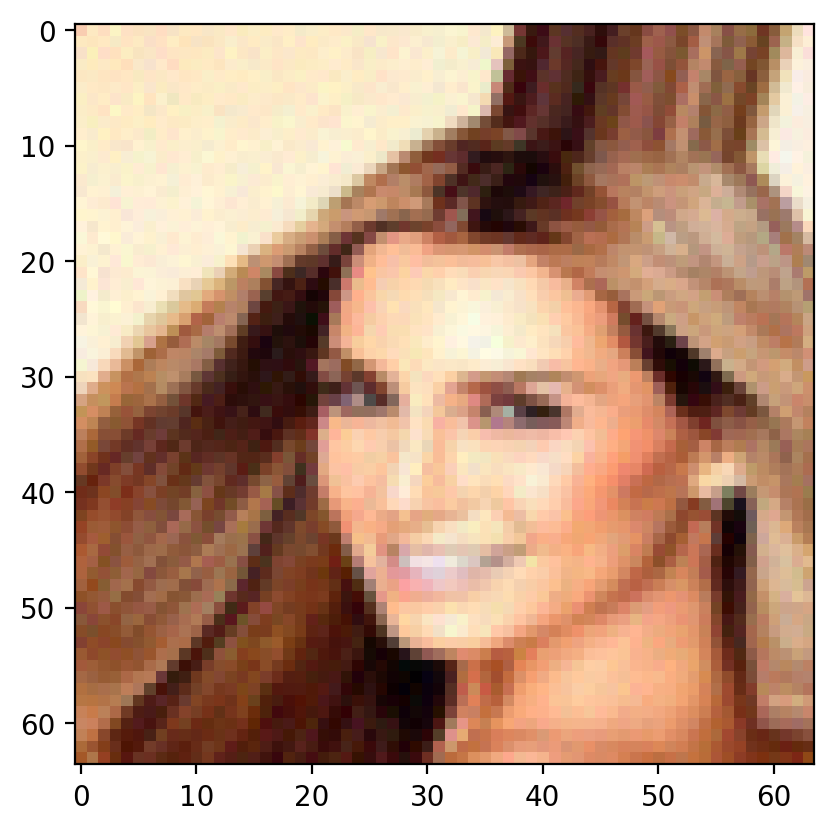

In [ ]:
plt.imshow(output.detach().cpu())

In [ ]:
output.permute(1, 2, 0).shape

torch.Size([64, 3, 64])

In [ ]:
img0_X

tensor([[-1.0000, -1.0000],
        [-0.9683, -1.0000],
        [-0.9365, -1.0000],
        ...,
        [ 0.9365,  1.0000],
        [ 0.9683,  1.0000],
        [ 1.0000,  1.0000]], device='cuda:0')

TypeError: ignored

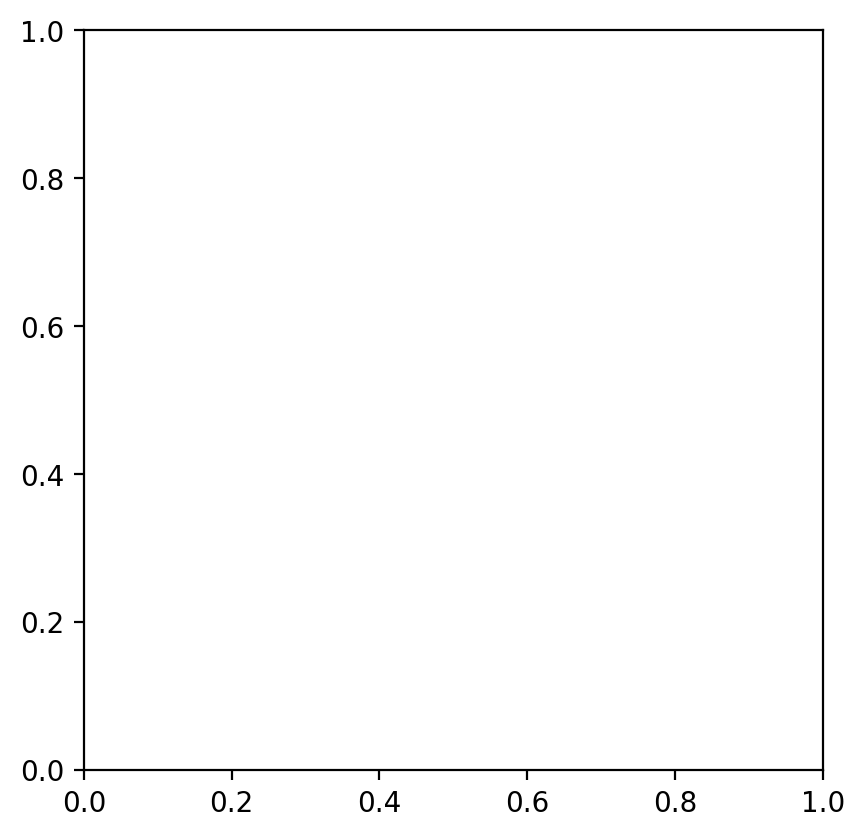

In [ ]:
plt.imshow(output.permute(1,2,0).detach().cpu())

In [ ]:
params = hypernet(context).mean(dim=0)

        flat_weights,unravel_fn= ravel_pytree(dict(targetnet.named_parameters()))

        parameter_dictionary = unravel_fn(params)

        outputs = torch.func.functional_call(targetnet, parameter_dictionary, X)
        print(output.shape)
        outputs = outputs.reshape(num_channels, height, width)
        outputs = outputs.permute(1, 2, 0)

torch.Size([64, 64, 3])


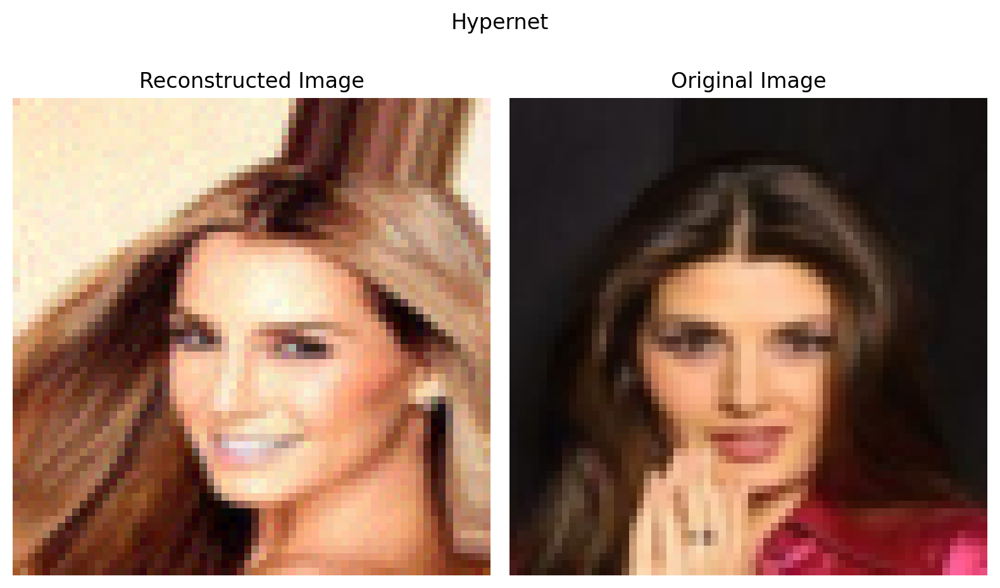

In [ ]:
plot_reconstructed_and_original_image(celeba_dataset[celebno],
                                      celeb_hp, celeb_targetnet, img0_X, test_context_data, title="Hypernet")

---

## Neural Process

In [44]:
import torch
import os
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torch.distributions as dist

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '0'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [45]:
import os

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

root = "CelebA_Dataset"
celeba_dataset = []

for filename in os.listdir(root):
    if filename.endswith('.jpg'):
        image_path = os.path.join(root, filename)
        image = datasets.folder.default_loader(image_path)
        image = transform(image)
        celeba_dataset.append(image)

In [46]:
len(celeba_dataset)

1001

torch.Size([3, 64, 64])


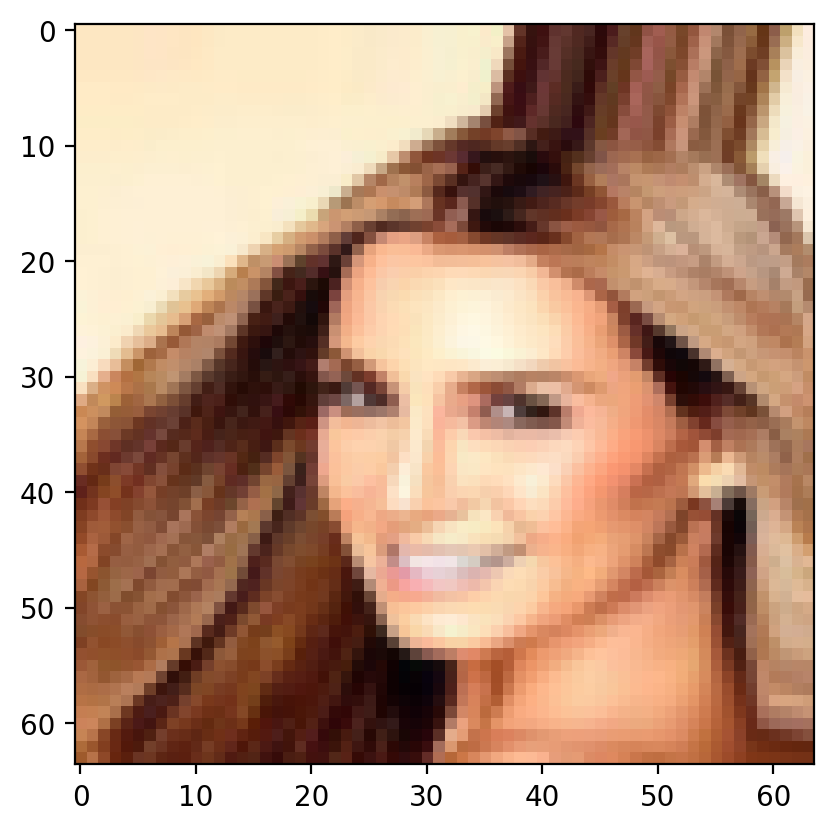

In [47]:
img0 = transform(datasets.folder.default_loader("CelebA_Dataset/000001.jpg"))
print(img0.shape)
plt.imshow(img0.permute(1,2,0))

In [48]:
from sklearn import preprocessing

def create_scaled_cmap(img, rt = False):
    """
    Creates a scaled image and a scaled colormap
    """
    img= img
    num_channels, height, width = img.shape

    # Create a 2D grid of (x,y) coordinates
    x_coords = torch.arange(width).repeat(height, 1)
    y_coords = torch.arange(height).repeat(width, 1).t()
    x_coords = x_coords.reshape(-1)
    y_coords = y_coords.reshape(-1)

    X = torch.stack([x_coords, y_coords], dim=1).float().to(device)
    # Y = img.permute(1, 2, 0).reshape(-1, num_channels).float().to(device)
    if rt == True:
      Y = img.permute(1, 2, 0).reshape(-1, num_channels).float().to(device)
    else:
      Y = img.reshape(-1, num_channels).float().to(device)

    scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(X.cpu())
    scaled_X = torch.tensor(scaler_X.transform(X.cpu())).to(device).float()

    return scaled_X, Y, scaler_X

In [49]:
img0_X_scaled, img0_Y, scaler_X = create_scaled_cmap(img0)
img0_X_scaled.shape, img0_Y.shape

(torch.Size([4096, 2]), torch.Size([4096, 3]))

In [50]:
# This neural process model will work for both encoder and decoder
# Smaller model
s = 64

class NN(nn.Module):
    def _init_siren(self, activation_scale):
        self.fc1.weight.data.uniform_(-1/self.fc1.in_features, 1/self.fc1.in_features)
        for layers in [self.fc2, self.fc3, self.fc5]:
            layers.weight.data.uniform_(-np.sqrt(6/self.fc2.in_features)/activation_scale,
                                        np.sqrt(6/self.fc2.in_features)/activation_scale)

    def __init__(self, inp_dim = 5, activation=torch.sin, n_out=3, activation_scale=1.0):
        super().__init__()
        self.activation = activation
        self.activation_scale = activation_scale
        self.fc1 = nn.Linear(inp_dim, s)
        self.fc2 = nn.Linear(s, s)
        self.fc3 = nn.Linear(s, s)
        self.fc5 = nn.Linear(s, n_out) #gray scale image (1) or RGB (3)
        if self.activation == torch.sin:
            # init weights and biases for sine activation
            self._init_siren(activation_scale=self.activation_scale)

    def forward(self, x):
        x = self.activation(self.activation_scale*self.fc1(x))
        x = self.activation(self.activation_scale*self.fc2(x))
        x = self.activation(self.activation_scale*self.fc3(x))
        # x = self.activation(self.activation_scale*self.fc4(x))
        return self.fc5(x)

In [51]:
img0_X_scaled.shape, img0_Y.shape

(torch.Size([4096, 2]), torch.Size([4096, 3]))

In [52]:
torch.manual_seed(40)
img0_np_data = []
datano = 10
context_percent_start = 10
context_percent_end = 50

for i in range(datano):
    contp = context_percent_start + (i/datano)*(context_percent_end - context_percent_start)
    sh_indexi = torch.randperm(img0_X_scaled.shape[0])
    cont_img0_X_shi = img0_X_scaled[sh_indexi][0:int(len(img0_X_scaled)*contp/100)]
    cont_img0_Y_shi = img0_Y[sh_indexi][0:int(len(img0_X_scaled)*contp/100)]
    context_data = torch.cat((cont_img0_X_shi, cont_img0_Y_shi), dim = 1)

    train_img0_X_shi = img0_X_scaled #[sh_indexi]
    train_img0_Y_shi = img0_Y #[sh_indexi]

    datas = [context_data, train_img0_X_shi, train_img0_Y_shi]
    img0_np_data.append(datas)

In [53]:
len(img0_np_data), img0_np_data[0][0].shape, img0_np_data[0][1].shape, img0_np_data[0][2].shape

(10, torch.Size([409, 5]), torch.Size([4096, 2]), torch.Size([4096, 3]))

Training the dataset

In [ ]:
K = 500
encoder2 = NN(inp_dim = 2+3, activation=torch.sin, n_out=K ).to(device)
decoder2 =  NN(inp_dim = K+2, activation=torch.sin, n_out=6).to(device)

encoder_output = encoder2(img0_np_data[0][0])
enocoded_rep = encoder_output.mean(dim=0).repeat(img0_np_data[0][1].shape[0], 1)
print(img0_np_data[0][0].shape, encoder_output.shape, enocoded_rep.shape)

train_rep = torch.concat((img0_np_data[0][1], enocoded_rep), dim = 1)
print(train_rep.shape)
outputs = decoder2(train_rep)
print(outputs.shape)

def softplus(std, beta = 1, threshold = 20):
  return (1/beta)*(torch.log(1 + torch.exp(std)))

print(type(softplus(outputs[:,3:])))

def normal_loss(mean, log_sigma, actual_val):
  # std = softplus(std)
  sigma = 0.1 + 0.9*softplus(log_sigma)
  # type(std) # sigma of sigma*(1/2)
  return -dist.Normal(mean, sigma).log_prob(actual_val).mean()

loss = normal_loss(outputs[:,:3], outputs[:,3:],  img0_np_data[0][2])
loss

torch.Size([409, 5]) torch.Size([409, 500]) torch.Size([4096, 500])
torch.Size([4096, 502])
torch.Size([4096, 6])
<class 'torch.Tensor'>


tensor(0.8217, device='cuda:0', grad_fn=<NegBackward0>)

In [54]:
def softplus(std, beta = 1, threshold = 20):
  return (1/beta)*(torch.log(1 + torch.exp(std)))

def normal_loss(mean, log_sigma, actual_val):
  sigma = 0.1 + 0.9*softplus(log_sigma)
  return -dist.Normal(mean, sigma).log_prob(actual_val).mean()

def train_np(encoder, decoder, np_data, lr, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """

    # criterion = nn.MSELoss()
    optimizer = torch.optim.Adam([*encoder.parameters(), *decoder.parameters()], lr=lr)
    datano = len(np_data)
    total_loss = []

    for epoch in range(epochs):
        running_loss = 0.0
        for i in range(len(np_data)):
            context_data, train_dog_X_shi, train_dog_Y_shi = np_data[i]

            optimizer.zero_grad()
            encoder_output = encoder(context_data)
            enocoded_rep = encoder_output.mean(dim=0).repeat(train_dog_X_shi.shape[0], 1)

            train_rep = torch.concat((train_dog_X_shi, enocoded_rep), dim = 1)
            outputs = decoder(train_rep)

            # loss = criterion(outputs[:,:3], train_dog_Y_shi)
            loss = normal_loss(outputs[:,:3], outputs[:,3:], train_dog_Y_shi)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

            # if verbose and epoch % 1 == 0:
            #   # print(encoder.state_dict()["fc1.weight"][0:2, 0:2], decoder.state_dict()["fc1.weight"][0:2, 0:2])
            #   print(f"Epoch {epoch} loss: {loss.item():.6f}")

        total_loss.append(running_loss)

        if verbose and epoch % 50 == 0:
        # if verbose and epoch % 1 == 0:
            # print(encoder.state_dict()["fc1.weight"][0:2, 0:2], decoder.state_dict()["fc1.weight"][0:2, 0:2])
            print(f"Epoch {epoch} loss: {running_loss/datano:.6f}")

    return total_loss

---
---
---

In [ ]:
import time

torch.manual_seed(0)
# can experiment with k
K = 500
encoder2 = NN(inp_dim = 2+3, activation=torch.sin, n_out=K ).to(device)
decoder2 =  NN(inp_dim = K+2, activation=torch.sin, n_out=6).to(device)

start_time = time.time()

loss_list = train_np(encoder2, decoder2, img0_np_data, lr=1e-3, epochs=8000, verbose=True)
end_time = time.time()

print(f"Training time: {end_time-start_time:.2f} seconds")

Epoch 0 loss: 1.337767
Epoch 50 loss: 0.094281
Epoch 100 loss: 0.091550
Epoch 150 loss: 0.085551
Epoch 200 loss: 0.078786
Epoch 250 loss: 0.075036
Epoch 300 loss: 0.068512
Epoch 350 loss: 0.057991
Epoch 400 loss: 0.032758
Epoch 450 loss: -0.116420
Epoch 500 loss: -0.232012
Epoch 550 loss: -0.305583
Epoch 600 loss: -0.349394
Epoch 650 loss: -0.386280
Epoch 700 loss: -0.409056
Epoch 750 loss: -0.445883
Epoch 800 loss: -0.460155
Epoch 850 loss: -0.474480
Epoch 900 loss: -0.505245
Epoch 950 loss: -0.487306
Epoch 1000 loss: -0.353294
Epoch 1050 loss: -0.533210
Epoch 1100 loss: -0.557027
Epoch 1150 loss: -0.426544
Epoch 1200 loss: -0.576683
Epoch 1250 loss: -0.502492
Epoch 1300 loss: -0.594420
Epoch 1350 loss: -0.607830
Epoch 1400 loss: -0.585463
Epoch 1450 loss: -0.637908
Epoch 1500 loss: -0.650928
Epoch 1550 loss: -0.464352
Epoch 1600 loss: -0.671424
Epoch 1650 loss: -0.626369
Epoch 1700 loss: -0.683977
Epoch 1750 loss: -0.699354
Epoch 1800 loss: -0.689624
Epoch 1850 loss: -0.718512
Epoch 

In [ ]:
# loss_list2 = train_np(encoder2, decoder2, img0_np_data, lr=1e-3, epochs=4000, verbose=True)

In [ ]:
torch.save(encoder2.state_dict(), "img0_encoder2_hypernet.pt")
torch.save(decoder2.state_dict(), "img0_decoder2_hypernet.pt")

Text(0, 0.5, 'loss')

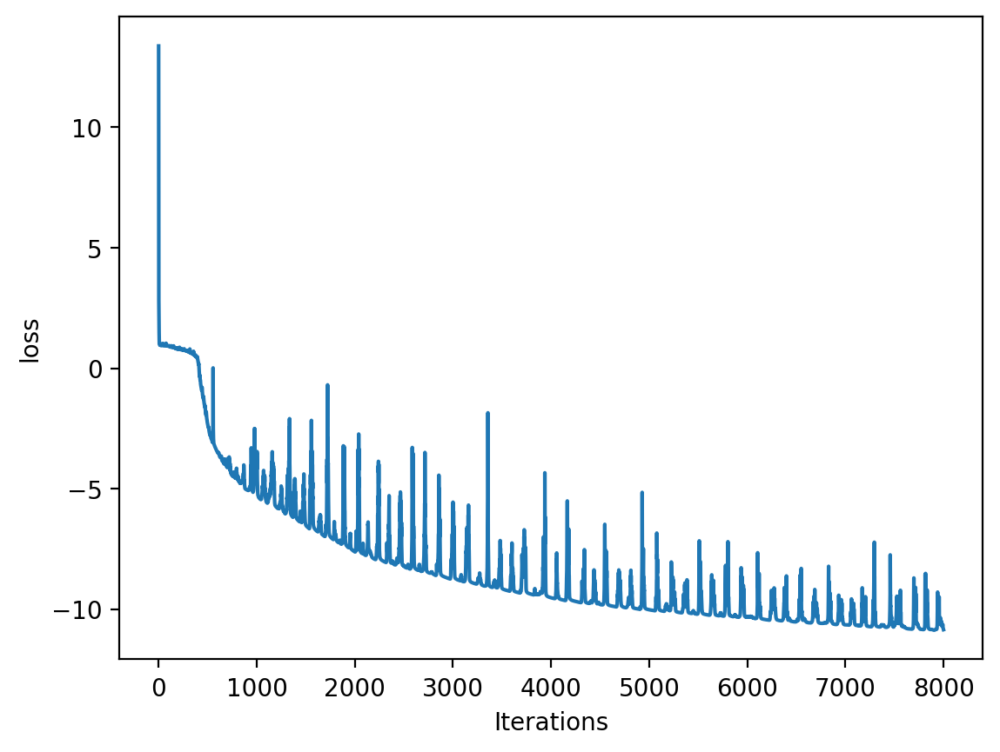

In [ ]:
plt.plot(loss_list)
plt.xlabel("Iterations")
plt.ylabel("loss")

In [57]:
K = 500
encoder2 = NN(inp_dim = 2+3, activation=torch.sin, n_out=K ).to(device)
decoder2 =  NN(inp_dim = K+2, activation=torch.sin, n_out=6).to(device)

encoder2.load_state_dict(torch.load("img0_encoder2_hypernet.pt", map_location=torch.device('cpu')))
decoder2.load_state_dict(torch.load("img0_decoder2_hypernet.pt", map_location=torch.device('cpu')))

<All keys matched successfully>

In [62]:
def plot_np_image(encoder, decoder, datano, key, context_percent, title = ""):
    torch.manual_seed(key)
    if datano == -1:
        scaled_X, Y, scaler_X = create_scaled_cmap(img0, rt = True)
    else:    
        scaled_X, Y, scaler_X = create_scaled_cmap(celeba_dataset[datano], rt = True)
    #now, the context has also changed
    sh_index = torch.randperm(scaled_X.shape[0])

    # if int(len(scaled_X)*context_percent/100) > 6000:
    #     print("context size is too big")
    #     return None

    cont_img_X = scaled_X[sh_index][0:int(len(scaled_X)*context_percent/100)]
    cont_img_Y = Y[sh_index][0:int(len(scaled_X)*context_percent/100)]
    context = torch.cat((cont_img_X, cont_img_Y), dim = 1)

    encoder_output = encoder(context)
    encoded_rep = encoder_output.mean(dim=0).repeat(scaled_X.shape[0], 1)

    train_rep = torch.cat((scaled_X, encoded_rep), dim = 1)
    output = decoder(train_rep)
    var = 0.1 + 0.9*softplus(output[:,3:]**2) #output[:,3:]**2
    output = output[:,:3]

    num_channels, height, width = celeba_dataset[datano].shape
    output = output.reshape(num_channels, height, width)
    output = output.permute(1, 2, 0)

    fig = plt.figure(figsize=(12, 6))
    gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])
    ax2 = plt.subplot(gs[2])
    ax3 = plt.subplot(gs[3])

    ax0.imshow(celeba_dataset[datano].cpu().permute(1, 2, 0))
    ax0.set_title("Original Image")
    ax0.axis("off")

    ax1.imshow(output.detach().cpu())
    ax1.set_title("Reconstructed Image")
    ax1.axis("off")

    actual_img = torch.ones(celeba_dataset[datano].shape).permute(1, 2, 0)
    # actual_img = (celeba_dataset[datano][0].cpu()*0).permute(1, 2, 0)
    cont_img_X_unscaled = scaler_X.inverse_transform(cont_img_X.cpu())
    for i,x in enumerate(cont_img_X_unscaled):
        actual_img[int(x[1]+0.5), int(x[0]+0.5)] = torch.tensor(cont_img_Y[i].cpu().detach().numpy())

    ax2.imshow(actual_img)
    # ax2.scatter(cont_img_X[:, 0].detach().cpu(), cont_img_X[:, 1].detach().cpu(), s=10, c='r')
    ax2.set_title("Context Points")
    ax2.axis("off")

    var = var.reshape(num_channels, height, width)
    var = var.permute(1, 2, 0)
    ax3.imshow(var.detach().cpu())
    ax3.set_title("Variance")
    ax3.axis("off")

    fig.suptitle(title, y=0.9)
    plt.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


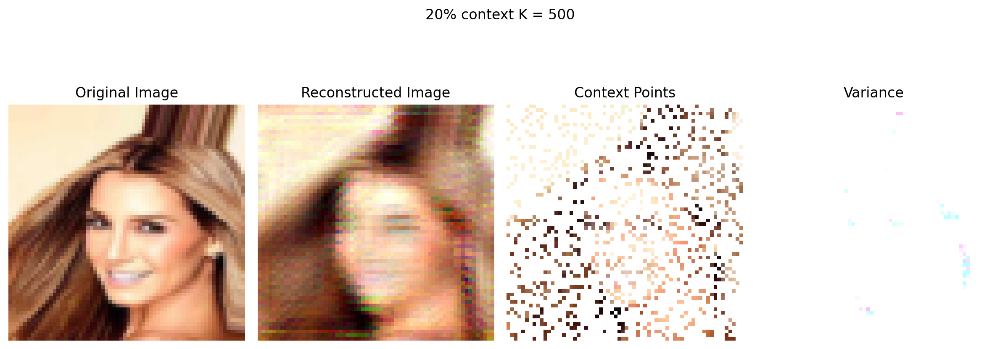

In [65]:
plot_np_image(encoder2, decoder2, datano = -1, key = 41, context_percent = 20, title = "20% context K = 500")

---
---
---

In [ ]:
import time

torch.manual_seed(0)
# can experiment with k
K = 200
encoder3 = NN(inp_dim = 2+3, activation=torch.sin, n_out=K ).to(device)
decoder3 =  NN(inp_dim = K+2, activation=torch.sin, n_out=6).to(device)

start_time = time.time()

loss_list3 = train_np(encoder3, decoder3, img0_np_data, lr=1e-3, epochs=8000, verbose=True)
end_time = time.time()

print(f"Training time: {end_time-start_time:.2f} seconds")

Epoch 0 loss: 0.985983
Epoch 50 loss: 0.094548
Epoch 100 loss: 0.094396
Epoch 150 loss: 0.094360
Epoch 200 loss: 0.094433
Epoch 250 loss: 0.086920
Epoch 300 loss: 0.076237
Epoch 350 loss: 0.068208
Epoch 400 loss: 0.061454
Epoch 450 loss: 0.051312
Epoch 500 loss: 0.002067
Epoch 550 loss: -0.171355
Epoch 600 loss: -0.258447
Epoch 650 loss: -0.351243
Epoch 700 loss: -0.318880
Epoch 750 loss: -0.430725
Epoch 800 loss: -0.443474
Epoch 850 loss: -0.442860
Epoch 900 loss: -0.471925
Epoch 950 loss: -0.354867
Epoch 1000 loss: -0.487307
Epoch 1050 loss: -0.485608
Epoch 1100 loss: -0.503016
Epoch 1150 loss: -0.463705
Epoch 1200 loss: -0.516598
Epoch 1250 loss: -0.413420
Epoch 1300 loss: -0.511021
Epoch 1350 loss: -0.534636
Epoch 1400 loss: -0.533560
Epoch 1450 loss: -0.550606
Epoch 1500 loss: -0.501212
Epoch 1550 loss: -0.564356
Epoch 1600 loss: -0.565869
Epoch 1650 loss: -0.566113
Epoch 1700 loss: -0.583977
Epoch 1750 loss: -0.594680
Epoch 1800 loss: -0.601825
Epoch 1850 loss: -0.603967
Epoch 19

Text(0, 0.5, 'loss')

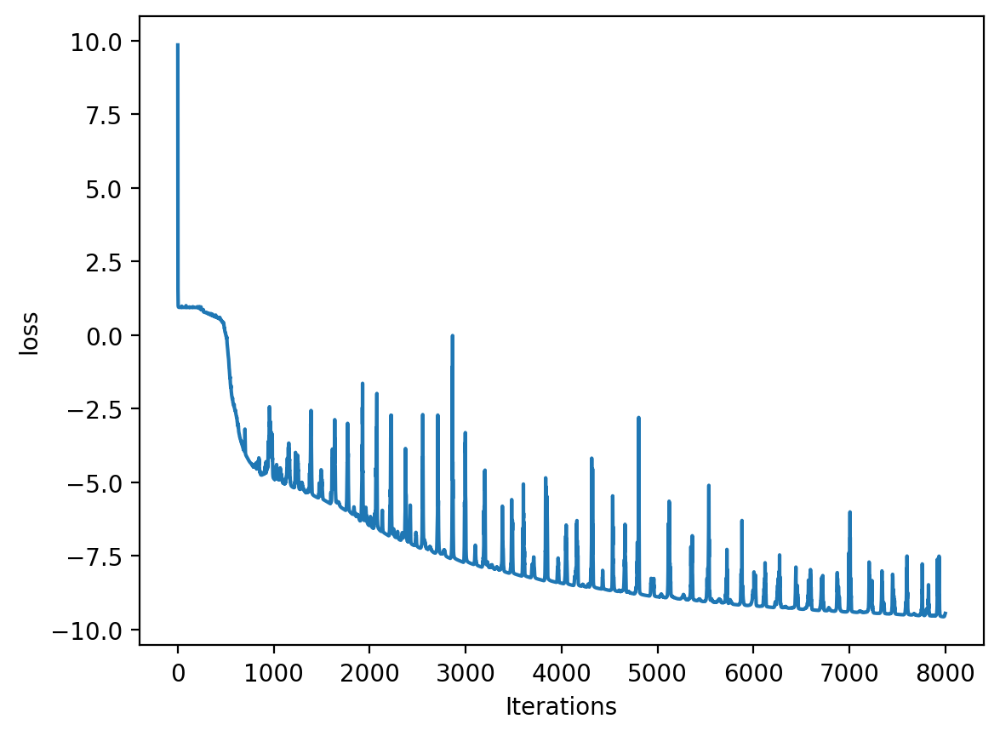

In [ ]:
plt.plot(loss_list3)
plt.xlabel("Iterations")
plt.ylabel("loss")

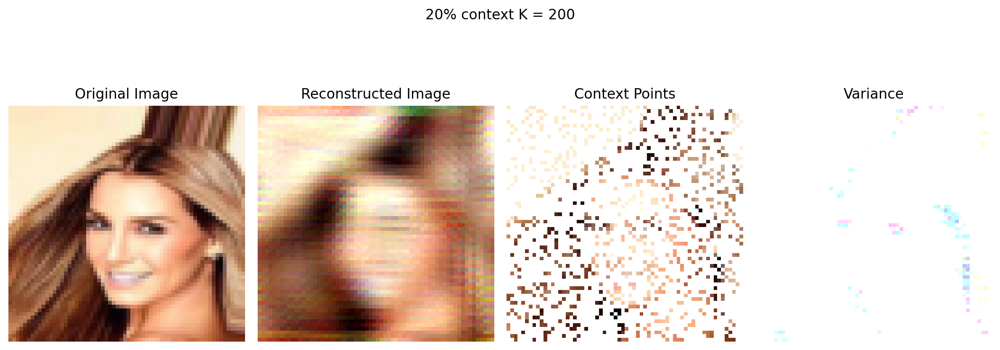

In [ ]:
plot_np_image(encoder3, decoder3, datano = 0, key = 41, context_percent = 20, title = "20% context K = 200")

---
---
---

Higher variance for lesser K

In [ ]:
import time

torch.manual_seed(0)
# can experiment with k
K = 1000
encoder4 = NN(inp_dim = 2+3, activation=torch.sin, n_out=K ).to(device)
decoder4 =  NN(inp_dim = K+2, activation=torch.sin, n_out=6).to(device)

start_time = time.time()

loss_list4 = train_np(encoder4, decoder4, img0_np_data, lr=1e-3, epochs=8000, verbose=True)
end_time = time.time()

print(f"Training time: {end_time-start_time:.2f} seconds")

Epoch 0 loss: 3.247491
Epoch 50 loss: 0.095072
Epoch 100 loss: 0.094696
Epoch 150 loss: 0.095501
Epoch 200 loss: 0.092775
Epoch 250 loss: 0.105793
Epoch 300 loss: 0.078307
Epoch 350 loss: 0.960751
Epoch 400 loss: 0.472558
Epoch 450 loss: 0.091825
Epoch 500 loss: 0.088676
Epoch 550 loss: 0.087290
Epoch 600 loss: 0.085511
Epoch 650 loss: 0.516163
Epoch 700 loss: 0.225607
Epoch 750 loss: 0.090968
Epoch 800 loss: 0.100098
Epoch 850 loss: 0.088283
Epoch 900 loss: 0.080500
Epoch 950 loss: 0.080115
Epoch 1000 loss: 0.364954
Epoch 1050 loss: 0.084921
Epoch 1100 loss: 0.078579
Epoch 1150 loss: 0.076788
Epoch 1200 loss: 0.081680
Epoch 1250 loss: 0.078172
Epoch 1300 loss: 0.069085
Epoch 1350 loss: 0.064416
Epoch 1400 loss: 0.296190
Epoch 1450 loss: 0.061623
Epoch 1500 loss: 0.050863
Epoch 1550 loss: 0.006544
Epoch 1600 loss: 0.018891
Epoch 1650 loss: -0.085501
Epoch 1700 loss: -0.113087
Epoch 1750 loss: -0.225822
Epoch 1800 loss: -0.237431
Epoch 1850 loss: -0.276261
Epoch 1900 loss: -0.392886
Epo

Text(0, 0.5, 'loss')

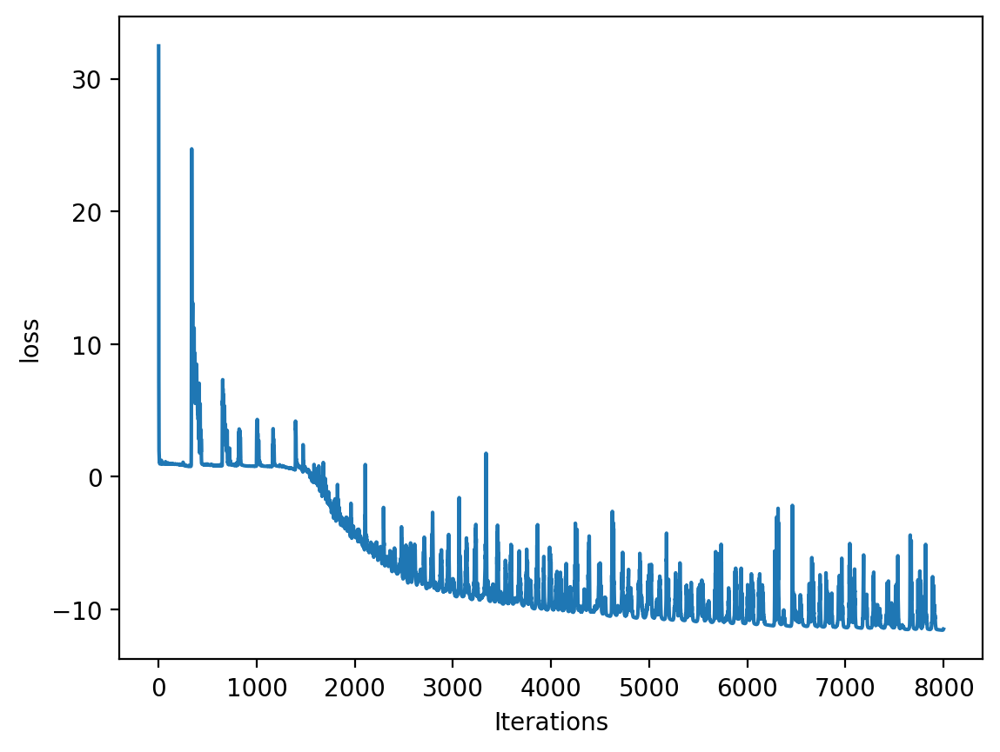

In [ ]:
plt.plot(loss_list4)
plt.xlabel("Iterations")
plt.ylabel("loss")

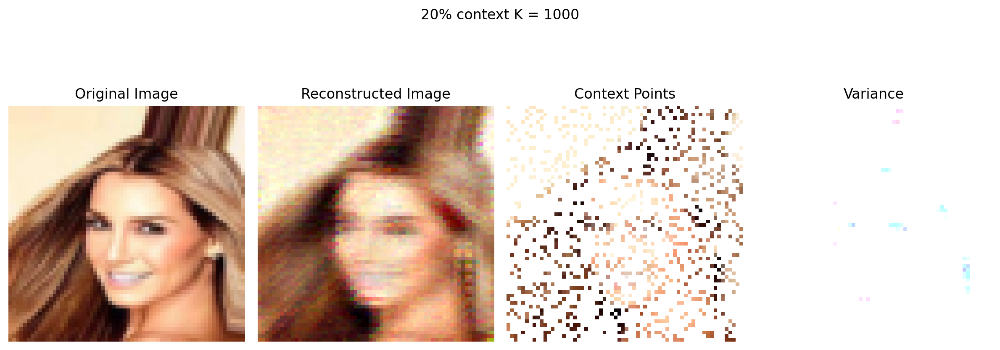

In [ ]:
plot_np_image(encoder4, decoder4, datano = 0, key = 41, context_percent = 20, title = "20% context K = 1000")

### Training for multiple images

10 dp, 8000 epochs = 4 min, 200 dp, 3500 epochs = 35 min

In [66]:
torch.manual_seed(42)
celeb_np_data = []
celebno = 50
datano = 4 # 100
context_percent_start = 10
context_percent_end = 50

for i in range(celebno):
    scaled_X, Y, scaler_X = create_scaled_cmap(celeba_dataset[i])
    for j in range(datano):
      context_percent = context_percent_start + (i/datano)*(context_percent_end - context_percent_start)
      sh_index = torch.randperm(scaled_X.shape[0])

      cont_img_Xi = scaled_X[sh_index][0:int(len(scaled_X)*context_percent/100)]
      cont_img_Yi = Y[sh_index][0:int(len(scaled_X)*context_percent/100)]
      context_data = torch.cat((cont_img_Xi, cont_img_Yi), dim = 1)

      train_img_Xi = scaled_X[sh_index]
      train_img_Yi = Y[sh_index]

      datas = [context_data, train_img_Xi, train_img_Yi]
      celeb_np_data.append(datas)

In [67]:
len(celeb_np_data) ,celeb_np_data[0][0].shape, celeb_np_data[0][1].shape, celeb_np_data[0][2].shape

(200, torch.Size([409, 5]), torch.Size([4096, 2]), torch.Size([4096, 3]))

---
---
---

In [ ]:
import time

torch.manual_seed(0)
K = 1000 # can change based on experiment
celeb_encoder = NN(inp_dim = 2+3, activation=torch.sin, n_out=K ).to(device)
celeb_decoder =  NN(inp_dim = K+2, activation=torch.sin, n_out=6).to(device)

start_time = time.time()
celeb_loss_list = train_np(celeb_encoder, celeb_decoder, celeb_np_data, lr=1e-3, epochs= 3500, verbose=True)
end_time = time.time()

print(f"Training time: {end_time-start_time:.2f} seconds")

Epoch 0 loss: 0.561838
Epoch 50 loss: 0.062497
Epoch 100 loss: 0.049615
Epoch 150 loss: -0.013535
Epoch 200 loss: -0.008642
Epoch 250 loss: -0.063802
Epoch 300 loss: -0.103127
Epoch 350 loss: -0.132578
Epoch 400 loss: -0.150624
Epoch 450 loss: -0.161050
Epoch 500 loss: -0.163209
Epoch 550 loss: -0.184284
Epoch 600 loss: -0.186982
Epoch 650 loss: -0.179719
Epoch 700 loss: -0.203929
Epoch 750 loss: -0.195653
Epoch 800 loss: -0.209538
Epoch 850 loss: -0.202713
Epoch 900 loss: -0.212755
Epoch 950 loss: -0.203270
Epoch 1000 loss: -0.210044
Epoch 1050 loss: -0.209445
Epoch 1100 loss: -0.223716
Epoch 1150 loss: -0.230180
Epoch 1200 loss: -0.219785
Epoch 1250 loss: -0.221717
Epoch 1300 loss: -0.229299
Epoch 1350 loss: -0.354515
Epoch 1400 loss: -0.472582
Epoch 1450 loss: -0.508528
Epoch 1500 loss: -0.522056
Epoch 1550 loss: -0.524381
Epoch 1600 loss: -0.533695
Epoch 1650 loss: -0.543165
Epoch 1700 loss: -0.532182
Epoch 1750 loss: -0.565511
Epoch 1800 loss: -0.564247
Epoch 1850 loss: -0.541689


In [ ]:
torch.save(celeb_encoder.state_dict(), "celeb_encoder1_hypernet.pt")
torch.save(celeb_decoder.state_dict(), "celeb_decoder1_hypernet.pt")


Text(0, 0.5, 'loss')

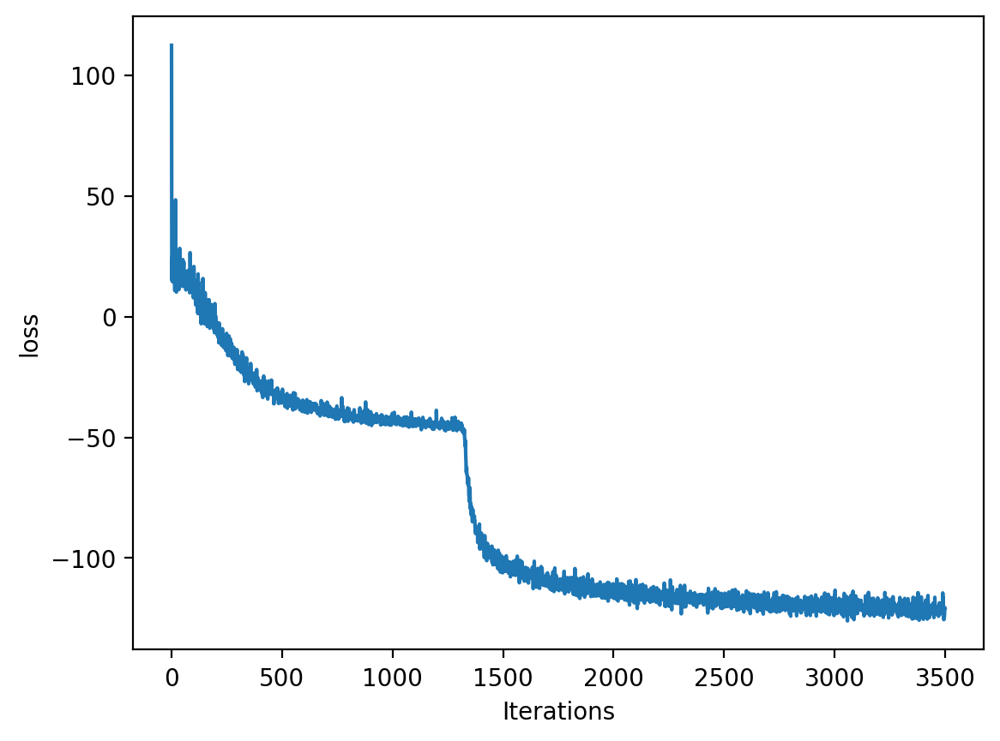

In [ ]:
plt.plot(celeb_loss_list)
plt.xlabel("Iterations")
plt.ylabel("loss")

In [68]:
K = 1000
celeb_encoder = NN(inp_dim = 2+3, activation=torch.sin, n_out=K ).to(device)
celeb_decoder =  NN(inp_dim = K+2, activation=torch.sin, n_out=6).to(device)

celeb_encoder.load_state_dict(torch.load("celeb_encoder1_hypernet.pt", map_location=torch.device('cpu')))
celeb_decoder.load_state_dict(torch.load("celeb_decoder1_hypernet.pt", map_location=torch.device('cpu')))

<All keys matched successfully>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


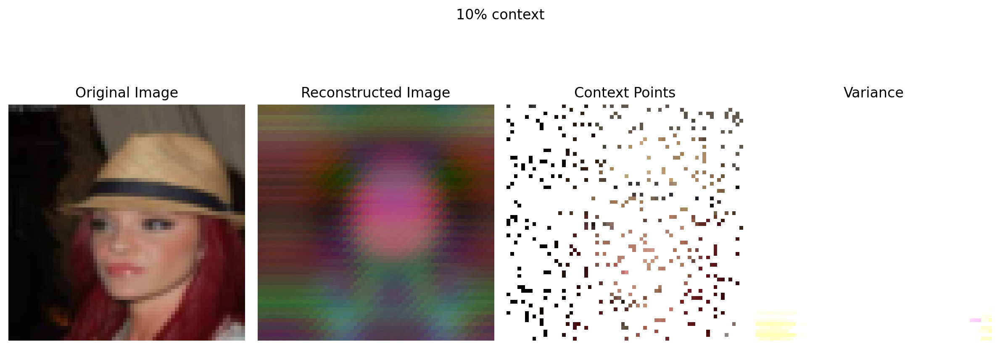

In [72]:
plot_np_image(celeb_encoder, celeb_decoder, datano = 4, key = 41, context_percent = 10, title = "10% context")

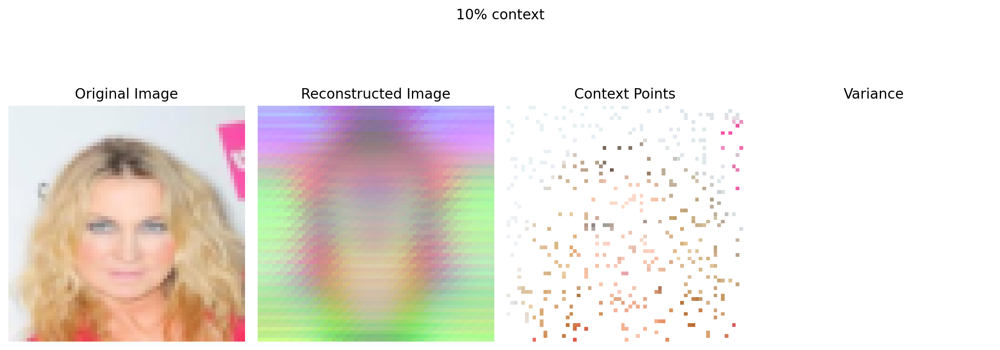

In [ ]:
plot_np_image(celeb_encoder, celeb_decoder, datano = 3, key = 41, context_percent = 10, title = "10% context")

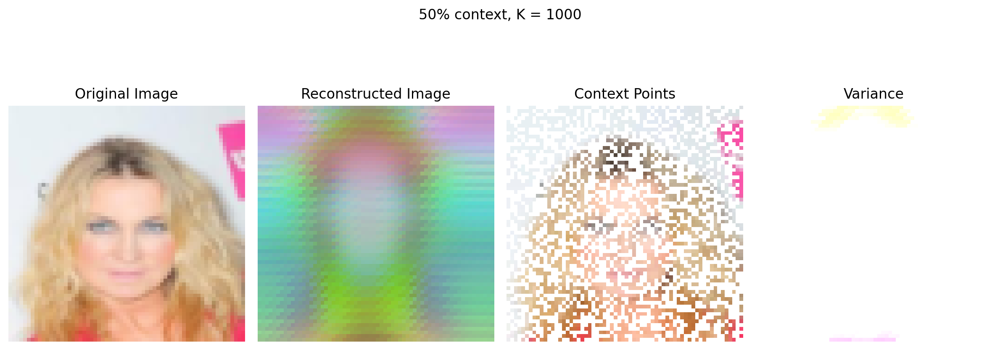

In [ ]:
plot_np_image(celeb_encoder, celeb_decoder, datano = 3, key = 41, context_percent = 50, title = "50% context, K = 1000")

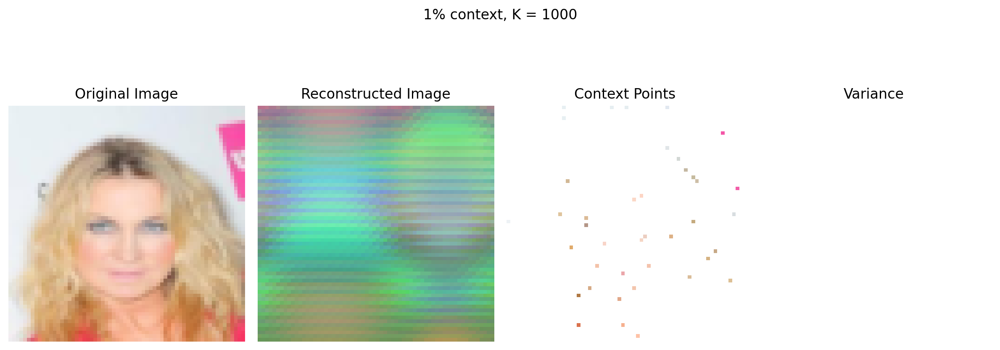

In [ ]:
plot_np_image(celeb_encoder, celeb_decoder, datano = 3, key = 41, context_percent = 1, title = "1% context, K = 1000")

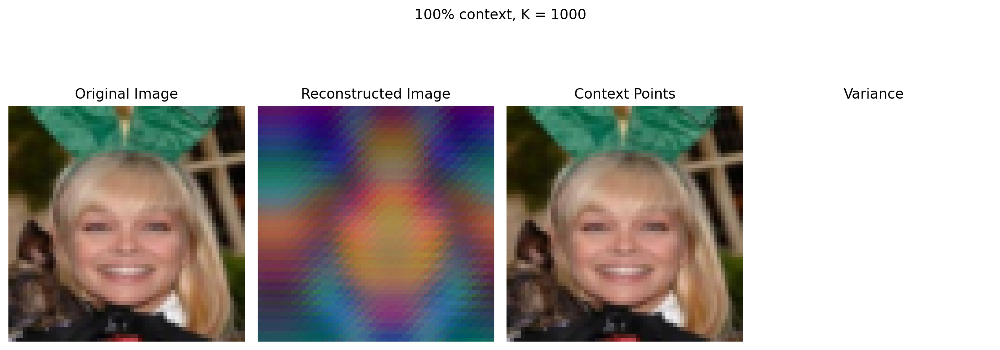

In [ ]:
plot_np_image(celeb_encoder, celeb_decoder, datano = 5, key = 41, context_percent = 100, title = "100% context, K = 1000")

In [ ]:
torch.manual_seed(42)
celeb_np_data = []
celebno = 50
datano = 4 # 100
context_percent_start = 10
context_percent_end = 50

for i in range(celebno):
    scaled_X, Y, scaler_X = create_scaled_cmap(celeba_dataset[i])
    for j in range(datano):
      context_percent = context_percent_start + (i/datano)*(context_percent_end - context_percent_start)
      sh_index = torch.randperm(scaled_X.shape[0])

      cont_img_Xi = scaled_X[sh_index][0:int(len(scaled_X)*context_percent/100)]
      cont_img_Yi = Y[sh_index][0:int(len(scaled_X)*context_percent/100)]
      context_data = torch.cat((cont_img_Xi, cont_img_Yi), dim = 1)

      train_img_Xi = scaled_X[sh_index]
      train_img_Yi = Y[sh_index]

      datas = [context_data, train_img_Xi, train_img_Yi]
      celeb_np_data.append(datas)

In [ ]:
len(celeb_np_data) ,celeb_np_data[0][0].shape, celeb_np_data[0][1].shape, celeb_np_data[0][2].shape

(200, torch.Size([409, 5]), torch.Size([4096, 2]), torch.Size([4096, 3]))

---
---
---

In [ ]:
import time

torch.manual_seed(0)
K = 1000 # can change based on experiment
celeb_encoder2 = NN(inp_dim = 2+3, activation=torch.sin, n_out=K ).to(device)
celeb_decoder2 =  NN(inp_dim = K+2, activation=torch.sin, n_out=6).to(device)

start_time = time.time()
celeb_loss_list2 = train_np(celeb_encoder2, celeb_decoder2, celeb_np_data, lr=1e-3, epochs= 6000, verbose=True)
end_time = time.time()

print(f"Training time: {end_time-start_time:.2f} seconds")

Epoch 0 loss: 0.479685
Epoch 50 loss: 0.168451
Epoch 100 loss: 0.089300
Epoch 150 loss: 0.095178
Epoch 200 loss: 0.069774
Epoch 250 loss: 0.023266
Epoch 300 loss: -0.022957
Epoch 350 loss: -0.045284
Epoch 400 loss: -0.066094
Epoch 450 loss: -0.083994
Epoch 500 loss: -0.102610
Epoch 550 loss: -0.112196
Epoch 600 loss: -0.118784
Epoch 650 loss: -0.126227
Epoch 700 loss: -0.124259
Epoch 750 loss: -0.124713
Epoch 800 loss: -0.130140
Epoch 850 loss: -0.138738
Epoch 900 loss: -0.143222
Epoch 950 loss: -0.142787
Epoch 1000 loss: -0.149772
Epoch 1050 loss: -0.145987
Epoch 1100 loss: -0.183938
Epoch 1150 loss: -0.297947
Epoch 1200 loss: -0.390763
Epoch 1250 loss: -0.417370
Epoch 1300 loss: -0.438389
Epoch 1350 loss: -0.451033
Epoch 1400 loss: -0.494825
Epoch 1450 loss: -0.488731
Epoch 1500 loss: -0.514693
Epoch 1550 loss: -0.542114
Epoch 1600 loss: -0.530419
Epoch 1650 loss: -0.525035
Epoch 1700 loss: -0.531059
Epoch 1750 loss: -0.543996
Epoch 1800 loss: -0.556629
Epoch 1850 loss: -0.549620
Epo

In [ ]:
torch.save(celeb_encoder2.state_dict(), "celeb_encoder2_hypernet.pt")
torch.save(celeb_decoder2.state_dict(), "celeb_decoder2_hypernet.pt")

Text(0, 0.5, 'loss')

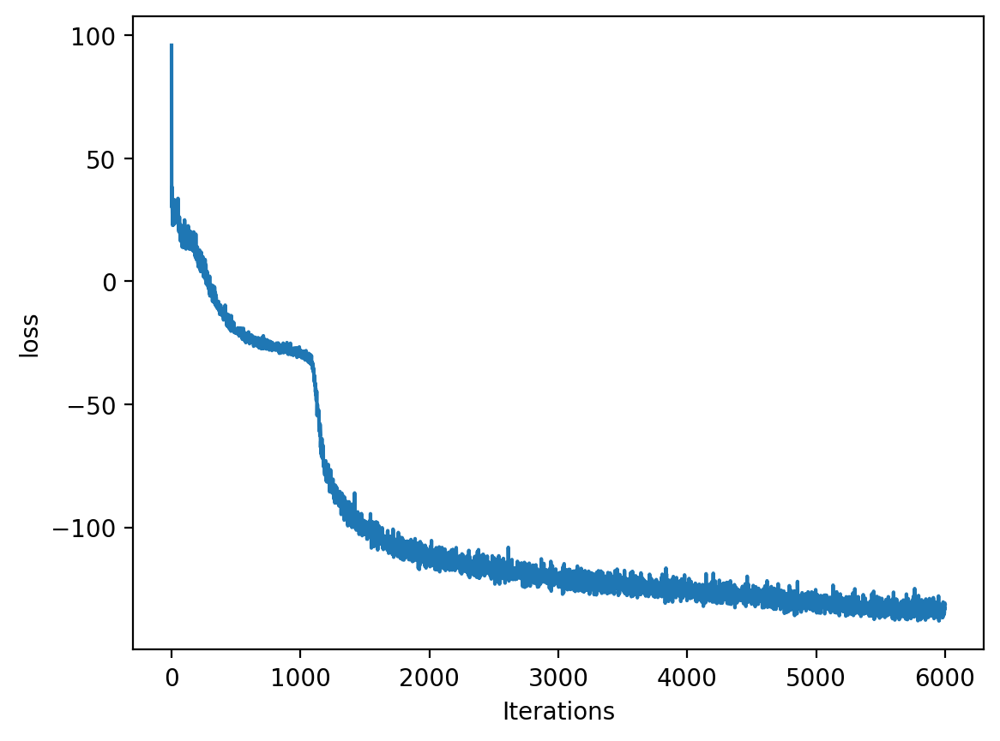

In [ ]:
plt.plot(celeb_loss_list2)
plt.xlabel("Iterations")
plt.ylabel("loss")

In [74]:
K = 1000
celeb_encoder2 = NN(inp_dim = 2+3, activation=torch.sin, n_out=K ).to(device)
celeb_decoder2 =  NN(inp_dim = K+2, activation=torch.sin, n_out=6).to(device)

celeb_encoder2.load_state_dict(torch.load("celeb_encoder2_hypernet.pt", map_location=torch.device('cpu')))
celeb_decoder2.load_state_dict(torch.load("celeb_decoder2_hypernet.pt", map_location=torch.device('cpu')))

<All keys matched successfully>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


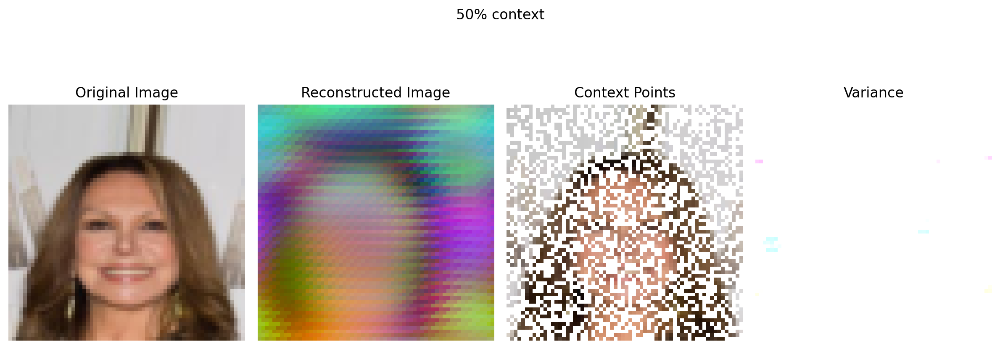

In [75]:
plot_np_image(celeb_encoder2, celeb_decoder2, datano = 10, key = 39, context_percent = 50, title = "50% context")

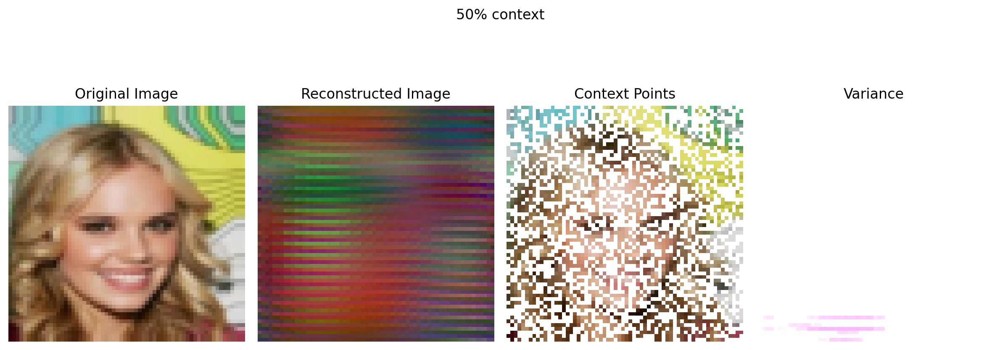

In [ ]:
plot_np_image(celeb_encoder2, celeb_decoder2, datano = 10, key = 39, context_percent = 50, title = "50% context")

---

# Question 4 [2 marks] 

Write the Random walk Metropolis Hastings algorithms from scratch. 

Take 1000 samples using below given log probs and compare the mean and covariance matrix with hamiltorch’s standard HMC and emcee’s Metropolis Hastings implementation. Use 500 samples as the burn/warm up samples. 

Also check the relation between acceptance ratio and the sigma of the proposal distribution in your from scratch implementation. Use the log likelihood function given below.

In [1]:
import torch
import torch.distributions as dist

def log_likelihood(omega):
    mean = torch.tensor([0., 0.])
    stddev = torch.tensor([0.5, 1.])
    return dist.MultivariateNormal(mean, torch.diag(stddev**2)).log_prob(omega).sum()

Text(0.5, 1.0, 'Log likelihood contour')

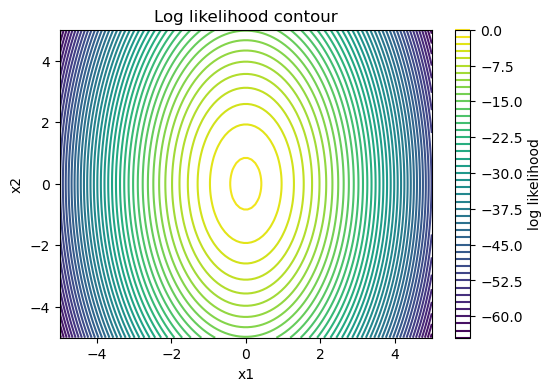

In [2]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

# The grid
x1 = np.linspace(-5, 5, 100)
x2 = np.linspace(-5, 5, 100)
X1, X2 = np.meshgrid(x1, x2)
Z = np.zeros_like(X1)
Z_exp = np.zeros_like(X1)

# Evaluate the function at each point on the grid
for i in range(X1.shape[0]):
    for j in range(X1.shape[1]):
        Z[i, j] = log_likelihood(torch.tensor([X1[i, j], X2[i, j]]))
        Z_exp[i, j] = np.exp(Z[i, j])

# Plot the contours
fig, ax = plt.subplots(figsize=(6, 4))
contour = ax.contour(X1, X2, Z, levels=50, cmap='viridis')
colorbar = plt.colorbar(contour, ax=ax, label='log likelihood')
ax.set_xlabel('x1')
ax.set_ylabel('x2')
ax.set_title('Log likelihood contour')

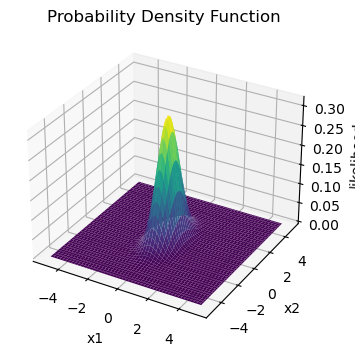

In [3]:
# 3-D Plot of the contours
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, Z_exp, cmap='viridis')
ax.set_xlabel('x1'); ax.set_ylabel('x2'); ax.set_zlabel('likelihood')
ax.set_title("Probability Density Function")
plt.show()

### Metropolis Hastings Algorithm

The acceptance ration of MHA is:-

$$
r = \frac{p(\theta^{*})/ J_{t}(\theta^{*}|\theta^{t-1})}{p(\theta^{t-1}) / J_{t}(\theta^{t-1}|\theta^{*})}
$$

Where $J_{t}(\theta^{*}|\theta^{t-1})$ is the jump distribution at time $t$.

In [4]:
import torch

def random_walk_metropolis_hastings(log_likelihood, initial_state, num_samples, jump_function):
    samples = [initial_state]
    current_state = initial_state
    accepted_count = 0

    for i in range(num_samples):
        # Propose a new state by adding Gaussian noise
        # proposal = current_state + proposal_stddev * torch.randn(current_state.shape)
        proposal = jump_function(current_state).sample()

        # Calculate the acceptance ratio
        log_prob_current = log_likelihood(current_state)
        log_prob_jump = jump_function(current_state).log_prob(proposal)
        log_prob_proposal = log_likelihood(proposal)
        log_prob_rev_jump = jump_function(proposal).log_prob(current_state)

        acceptance_ratio = torch.exp(log_prob_proposal - log_prob_jump - log_prob_current + log_prob_rev_jump)

        # Accept or reject the proposal
        if torch.rand(1) < acceptance_ratio:
            current_state = proposal
            accepted_count += 1
        else:
            i -= 1

        samples.append(current_state)

    acceptance_rate = accepted_count / num_samples
    return torch.stack(samples[500:]), torch.stack(samples), acceptance_rate

In [9]:
torch.manual_seed(0)

normal_stddev = torch.tensor([[0.1,0],[0,0.1]])#0.1

def gaussian_jump(current_state):
    return dist.MultivariateNormal(current_state, normal_stddev)

initial_state = torch.tensor([-4, 3.5])
jump_function = gaussian_jump
num_samples = 1500

samples, all_samples, accp_rate = random_walk_metropolis_hastings(log_likelihood, initial_state, num_samples, jump_function)

In [10]:
accp_rate, samples.shape, all_samples.shape

(0.756, torch.Size([1001, 2]), torch.Size([1501, 2]))

In [11]:
def plot_samples(samples, title, lines = False):
    x1 = np.linspace(-5, 5, 100)
    x2 = np.linspace(-5, 5, 100)
    X1, X2 = np.meshgrid(x1, x2)
    Z = np.zeros_like(X1)
    Z_exp = np.zeros_like(X1)

    # Evaluate the function at each point on the grid
    for i in range(X1.shape[0]):
        for j in range(X1.shape[1]):
            Z[i, j] = log_likelihood(torch.tensor([X1[i, j], X2[i, j]]))
            Z_exp[i, j] = np.exp(Z[i, j])

    # Plot the contours
    fig, ax = plt.subplots(figsize=(8, 6))
    if lines:
        ax.plot(samples.numpy()[:, 0], samples.numpy()[:, 1], alpha=0.5, color = "red", label='Samples')
    # else:
    ax.scatter(samples.numpy()[:, 0], samples.numpy()[:, 1], s=2, alpha=0.5, label='Samples')
    contour = ax.contour(X1, X2, Z, levels=50, cmap='viridis')
    colorbar = plt.colorbar(contour, ax=ax, label='log likelihood')
    ax.legend()
    fig.suptitle(title)
    ax.set_xlabel('x1')
    ax.set_ylabel('x2')

    plt.plot

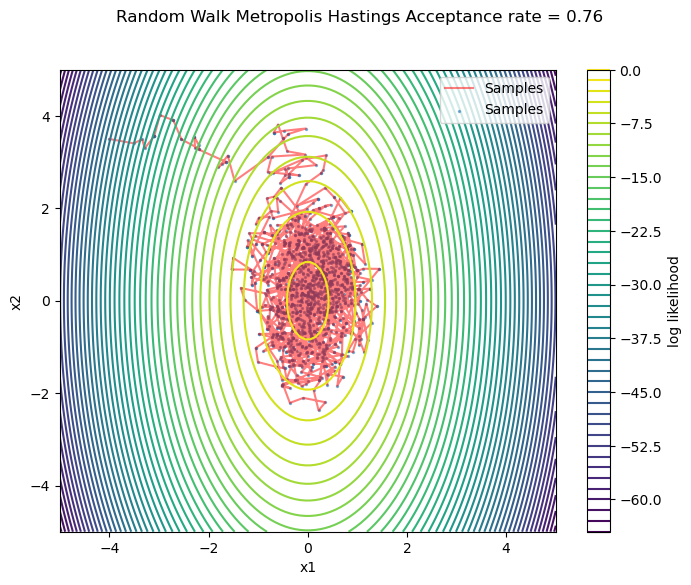

In [12]:
plot_samples(all_samples, f'Random Walk Metropolis Hastings Acceptance rate = {accp_rate:.2f}', lines = True)

In [13]:
mean = torch.mean(samples, dim=0)
cov = torch.tensor(np.cov(samples.T))
samples.shape, mean, cov

(torch.Size([1001, 2]),
 tensor([0.0460, 0.1631]),
 tensor([[0.2572, 0.0197],
         [0.0197, 0.7183]], dtype=torch.float64))

In [17]:
import hamiltorch
torch.manual_seed(0)

params_init = torch.tensor([-4, 3.5])
samples_hmc = hamiltorch.sample(log_prob_func= log_likelihood, params_init=params_init, num_samples=1500,
                               step_size=0.1, num_steps_per_sample=10)

Sampling (Sampler.HMC; Integrator.IMPLICIT)
Time spent  | Time remain.| Progress             | Samples   | Samples/sec
0d:00:00:09 | 0d:00:00:00 | #################### | 1500/1500 | 158.76       
Acceptance Rate 0.99


In [18]:
samples_hmc = torch.stack(samples_hmc)[500:]
samples_hmc.shape

torch.Size([1000, 2])

In [19]:
hmc_mean = torch.mean(samples_hmc, dim=0)
hmc_cov = torch.tensor(np.cov(samples_hmc.T))
samples_hmc.shape, hmc_mean, hmc_cov

(torch.Size([1000, 2]),
 tensor([0.0072, 0.0218]),
 tensor([[0.2324, 0.0075],
         [0.0075, 0.9991]], dtype=torch.float64))

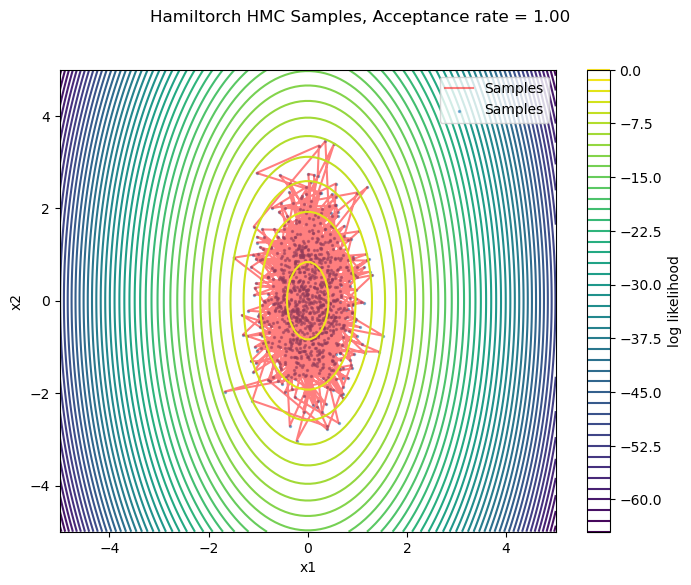

In [20]:
plot_samples(samples_hmc, f'Hamiltorch HMC Samples, Acceptance rate = 1.00', lines = True)

### Trying Emcee

In [21]:
import emcee

means = np.array([0, 0])
cov = np.array([[0.1, 0.0],
                [0.0, 0.1]])

def log_prob(x, mu, cov):
    diff = x - mu
    return -0.5 * np.dot(diff, np.linalg.solve(cov, diff))

ndim = 2
nwalkers = 5
p0 = np.random.rand(nwalkers, ndim)

sampler = emcee.EnsembleSampler(nwalkers, ndim, log_prob, args=[means, cov])

In [22]:
state = sampler.run_mcmc(p0, 100)
sampler.reset()

result = sampler.run_mcmc(state, 200)

In [23]:
emcee_accprate = np.mean(sampler.acceptance_fraction)
print(
    "Mean acceptance fraction: {0:.3f}".format(
        emcee_accprate
    )
)

Mean acceptance fraction: 0.728


In [24]:
samples_emcee = sampler.get_chain(flat=True)
samples_emcee.shape

(1000, 2)

In [25]:
emcee_mean = np.array([np.mean(samples_emcee[:,0]),np.mean(samples_emcee[:,1])])
emcee_cov = np.cov(samples_emcee.T)
samples_emcee.shape, emcee_mean, emcee_cov

((1000, 2),
 array([-6.58492212e-05,  1.04466032e-02]),
 array([[0.08967083, 0.0057612 ],
        [0.0057612 , 0.09591614]]))

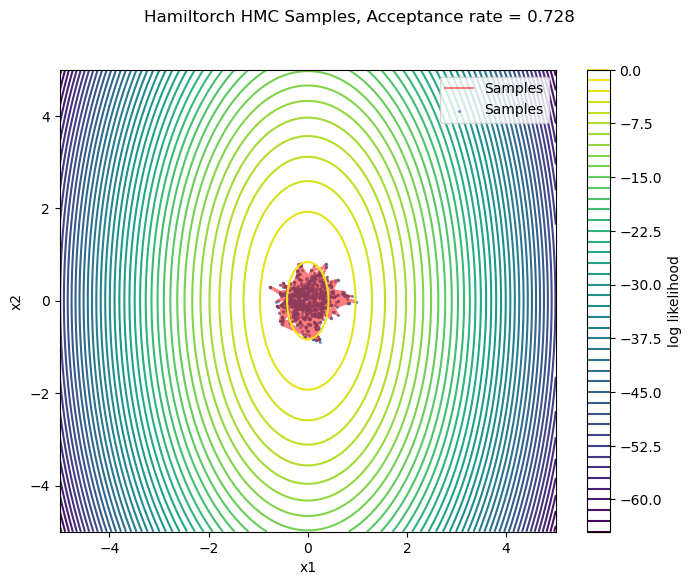

In [26]:
plot_samples(torch.tensor(samples_emcee), f'Hamiltorch HMC Samples, Acceptance rate = {emcee_accprate:.3f}', lines = True)